In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 20
plt.rc('xtick', labelsize=16) 
plt.rc('ytick', labelsize=16) 

In [2]:
df = pd.read_excel('PhD student status.xlsx')
importance_dict = {'\xa0Important\xa0 (Medium priority)':2, 'Very important (Top priority)':3,
        'Critically important (Non-negotiable)':4,
        'Low importance\xa0 (Low priority)':1, 'Not important at all (No priority)':0}

In [3]:
df.drop([df.columns[5],'ID', 'Start time', 'Completion time', 'Email', 'Name', 'Please write here any additional comments or questions that you might have:'], axis = 1,inplace=True)
df.at[10,'Department in which PhD program you are enrolled in:'] = 'Department of Environmental Sciences and Policy'
df

,Department in which PhD program you are enrolled in:,What is your current year of study?,Are you a third country national (a non-EU citizen)?,Where is your current official residence?,Do you plan to apply for or to extend your residence in Vienna next year?,What is your source of funding for your PhD studies?,100 % health reimbursement (as opposed to current 80 % from SVS + CEU emergency funds ),Access to private English-speaking doctors,"Extensive health insurance coverage (dental treatment, glasses e.g.)",International (outside Austria) health insurance coverage,...,Residence permit that is potentially obtained more quickly or with less buerocratic work,"Financial predictability (exactly knowing your expenses in advance, eg. for Finanzonline or SVS contributions)",Legal predictability (exactly knowing that the you will not have any legal problems),No additional requirements to do unpaid mandatory TA work,No additional restrictions on the academic freedom (ability to choose your own research topic and work independently),Low administrative burden (no more than 2 hours per month),"No additional workload (mandated research, seminars, etc.)",No requirement to come to Vienna campus regularly after completing 1st year mandatory coursework,"If you were employed by CEU (with all employment benefits in Austria), had the same net monthly income as now, how many extra TAships per year would you be willing to do? \n","If you were employed by CEU (with all employment benefits in Austria), and had your current net monthly income as now + 300 EUR, how many extra TAships per year would you be willing to do?\n"
0,Department of History,3rd,Yes,Elsewhere outside EU,No,CEU PhD stipend,Very important (Top priority),Important (Medium priority),Low importance (Low priority),Critically important (Non-negotiable),...,Critically important (Non-negotiable),Important (Medium priority),Important (Medium priority),Important (Medium priority),Important (Medium priority),Important (Medium priority),Low importance (Low priority),Important (Medium priority),2,2
1,"Doctoral School of Political Science, Public P...",4th,No,Budapest,No,CEU PhD stipend,Important (Medium priority),Very important (Top priority),Very important (Top priority),Low importance (Low priority),...,Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),0,1
2,Department of Legal Studies,2nd,No,Vienna,Yes,CEU PhD stipend,Critically important (Non-negotiable),Important (Medium priority),Critically important (Non-negotiable),Critically important (Non-negotiable),...,Important (Medium priority),Very important (Top priority),Very important (Top priority),Not important at all (No priority),Important (Medium priority),Important (Medium priority),Very important (Top priority),Critically important (Non-negotiable),0,3
3,"Doctoral School of Political Science, Public P...",1st,Yes,Vienna,Yes,CEU PhD stipend,Very important (Top priority),Very important (Top priority),Important (Medium priority),Low importance (Low priority),...,Very important (Top priority),Critically important (Non-negotiable),Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),Very important (Top priority),2,1
4,Department of Network and Data Science,1st,No,Vienna,Maybe,CEU PhD stipend,Critically important (Non-negotiable),Critically important (Non-negotiable),Important (Medium priority),Very important (Top priority),...,Important (Medium priority),Critically important (Non-negotiable),Critically important (Non-negotiable),Low importance (Low priority),Very important (Top priority),Important (Medium priority),Important (Medium priority),Very important (Top priority),0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [4]:
df = df.replace(importance_dict )
#df["Access to private English-speaking doctors"] = df["Access to private English-speaking doctors"].map(importance_dict)

([<matplotlib.axis.XTick at 0x7f15ead938e0>,
 [Text(0, 0, 'Not important at all (No priority)'),
  Text(1, 0, 'Low importance (Low priority)'),
  Text(2, 0, 'Important (Medium priority)'),
  Text(3, 0, 'Very important (Top priority)'),
  Text(4, 0, 'Critically important (Non-negotiable)')])

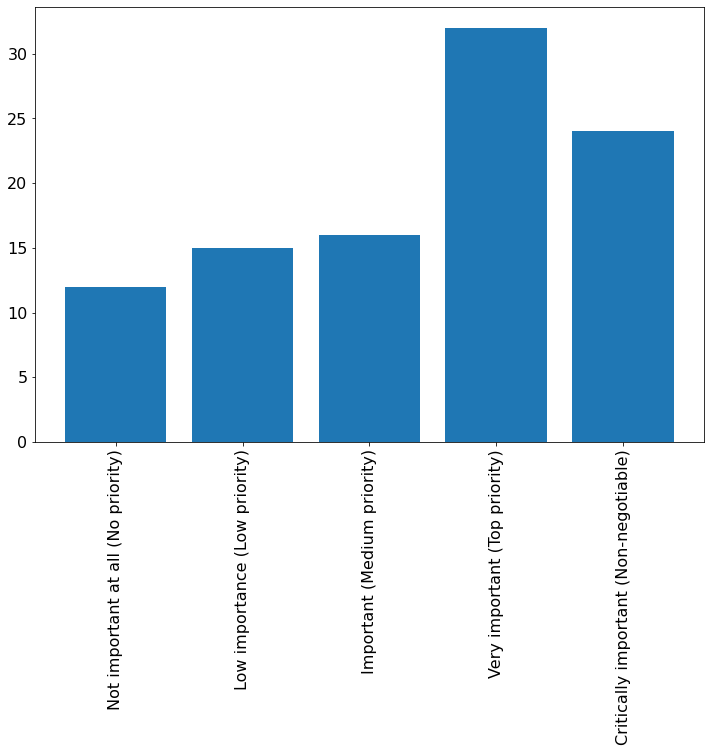

In [5]:
sublist = df[['Access to private English-speaking doctors']].values
labels, counts = np.unique(sublist, return_counts=True)
f, ax = plt.subplots(figsize=(12,8))
plt.bar(labels, counts)
plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])

In [6]:
for i, column in enumerate(df.columns):
    print(i,column)

0 Department in which PhD program you are enrolled in:
1 What is your current year of study?
2 Are you a third country national (a non-EU citizen)?
3 Where is your current official residence?
4 Do you plan to apply for or to extend your residence in Vienna next year?
5 What is your source of funding for your PhD studies?
6  100 % health reimbursement (as opposed to current 80 % from SVS + CEU emergency funds ) 
7 Access to private English-speaking doctors
8 Extensive health insurance coverage (dental treatment, glasses e.g.)
9 International (outside Austria) health insurance coverage
10 Direct billing for health insurance
11 Paid sick leave
12 Unemployment insurance (renumeration while you are not employed)
13 Paid parental leave
14 Net income higher than 1350 EUR (higher than the current stipend, can be specified in Additional Comments)
15 Ability to work part-time 
16 Inflation adjustment of stipends
17 Opportunity to reside and work in Austria after graduation
18 Residence permit th

# General analysis

6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26


<ipython-input-7-49d2dafafabe>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


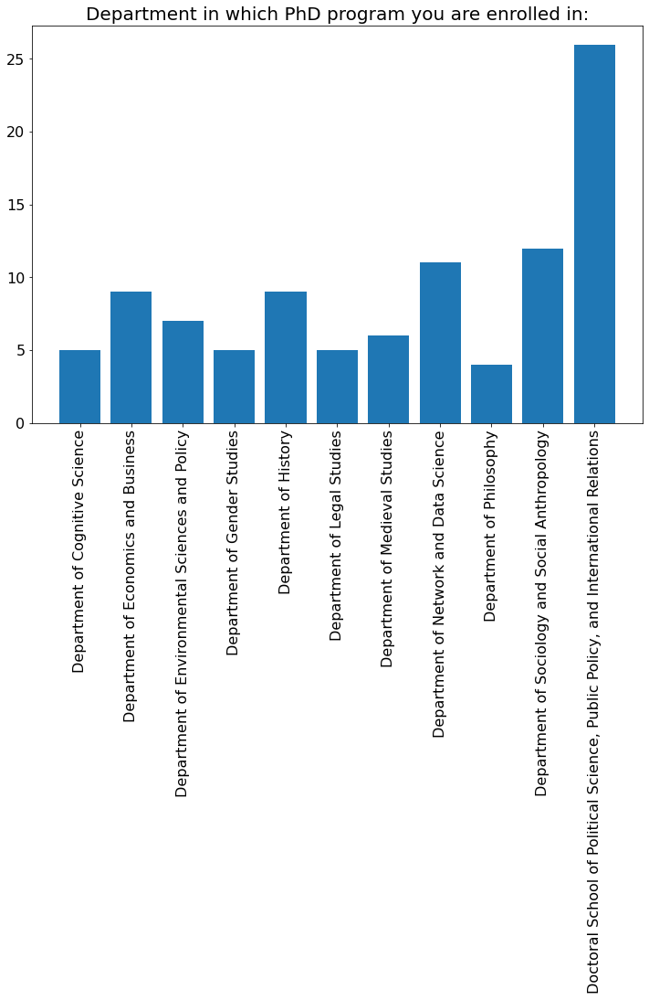

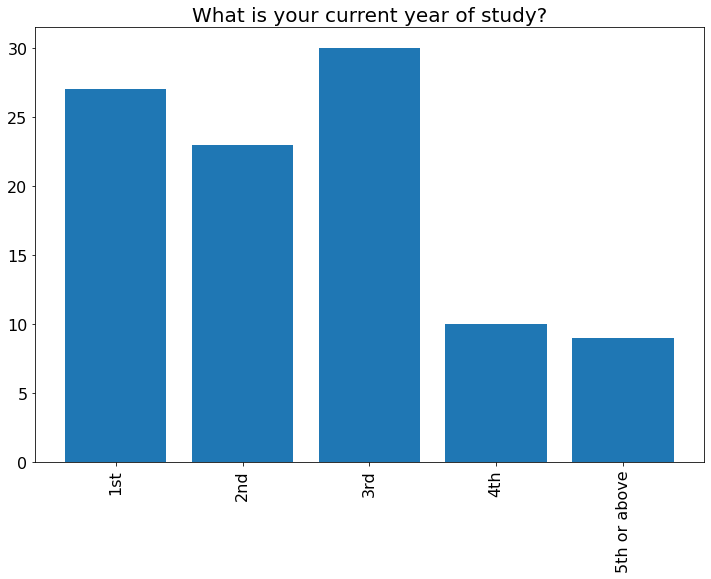

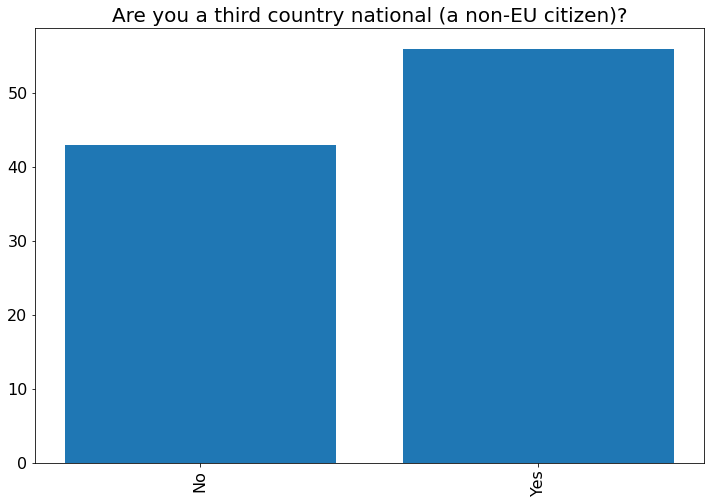

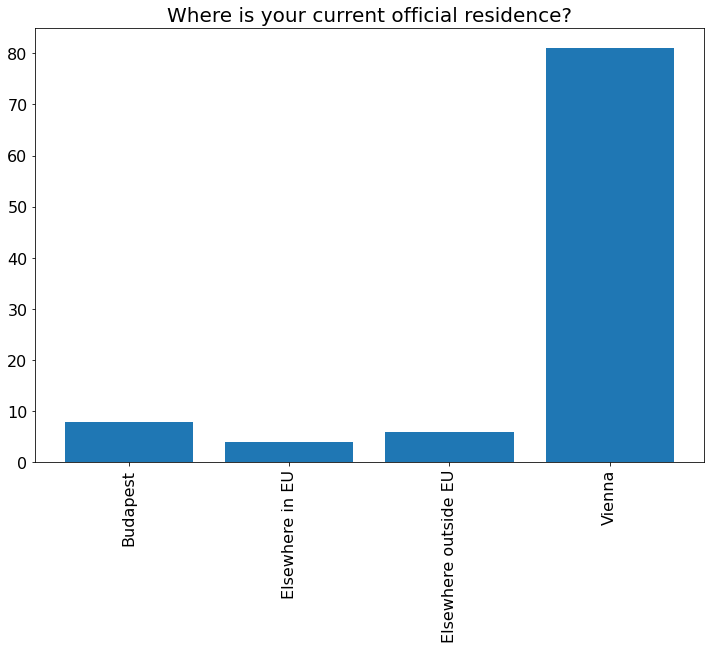

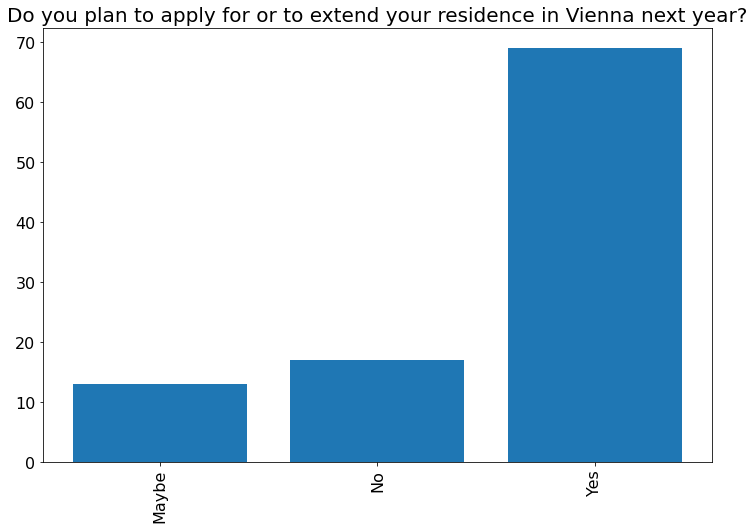

...

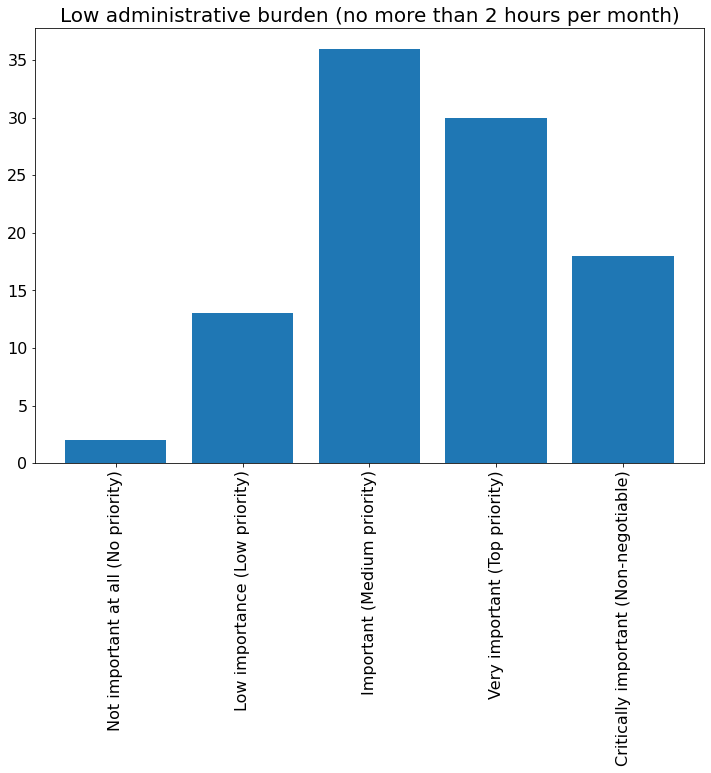

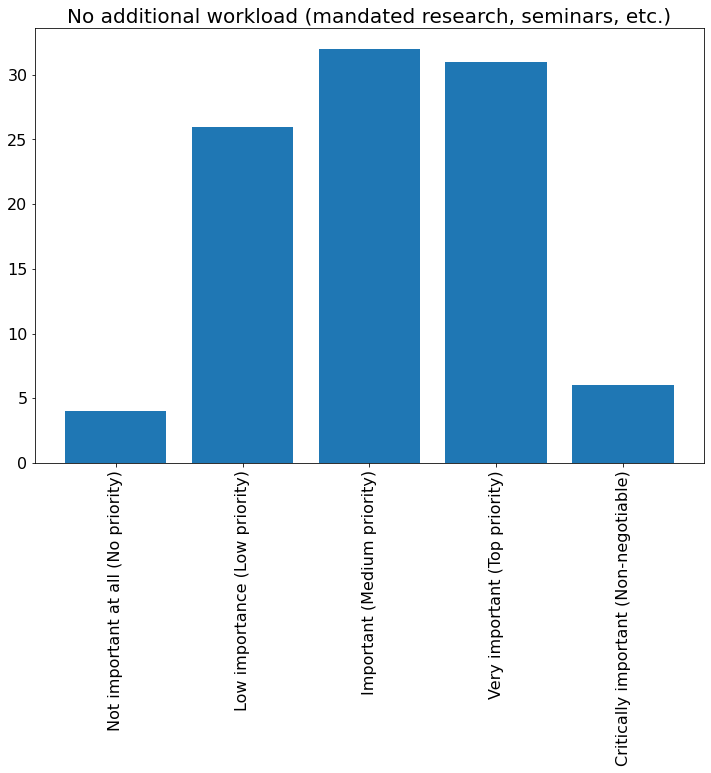

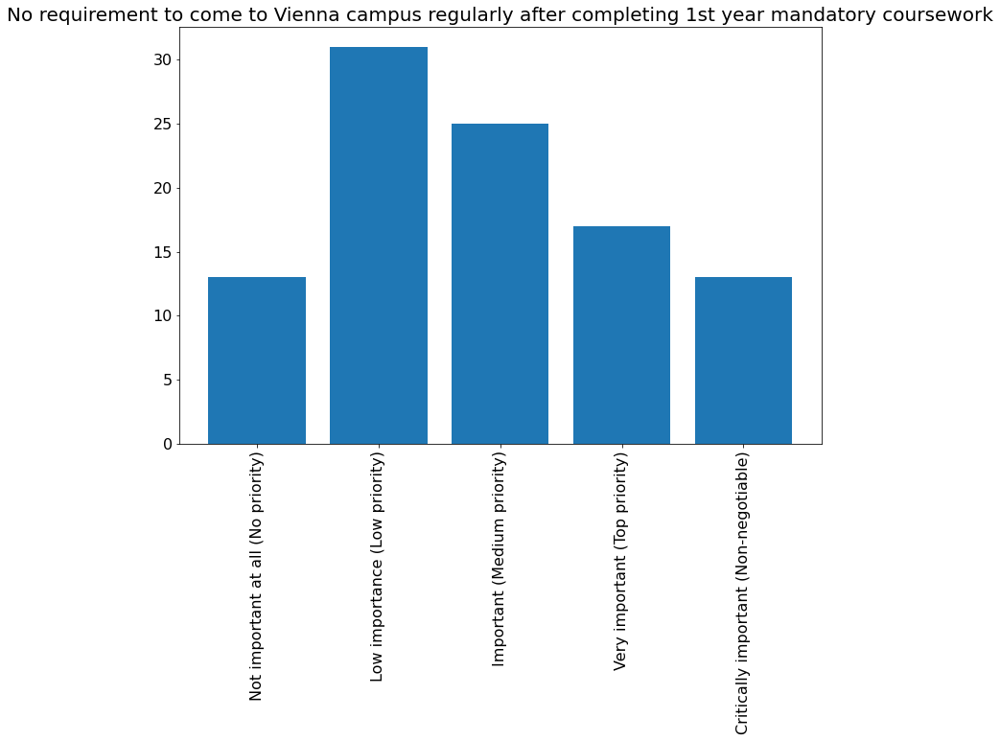

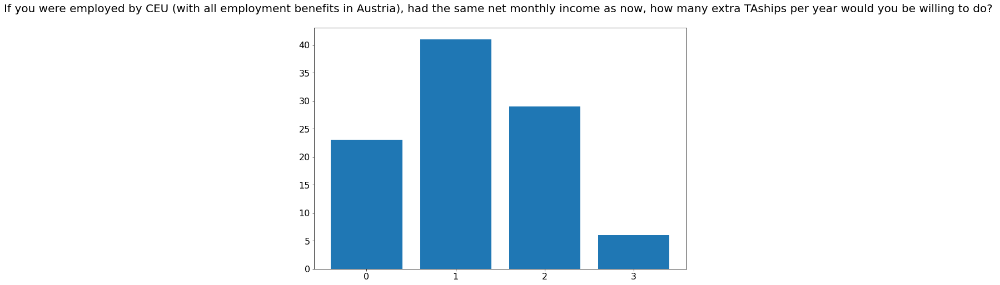

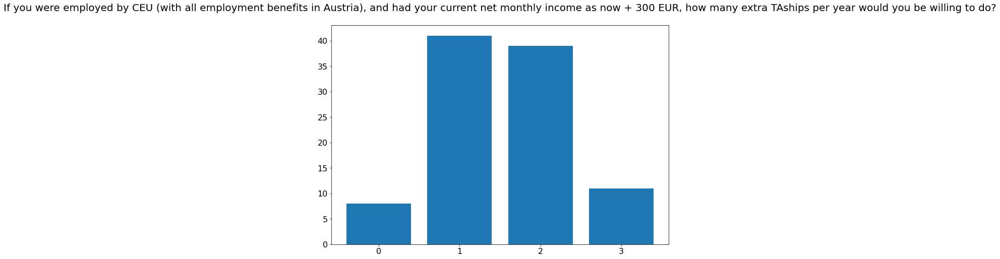

In [7]:
for i, column in enumerate(df.columns):
    #print(i)
    sublist = df[[column]].values
    labels, counts = np.unique(sublist, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels, counts)
    if i>=6 and i<=26:
        print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)

# Department level analysis

In [8]:
dept_list = list(set(list(df[df.columns[0]].values)))
df_dict = {}
for dept in dept_list:
    df_dict[dept] = df[df[df.columns[0]] == dept]

6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


<ipython-input-9-20929515eeac>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


24
25
26


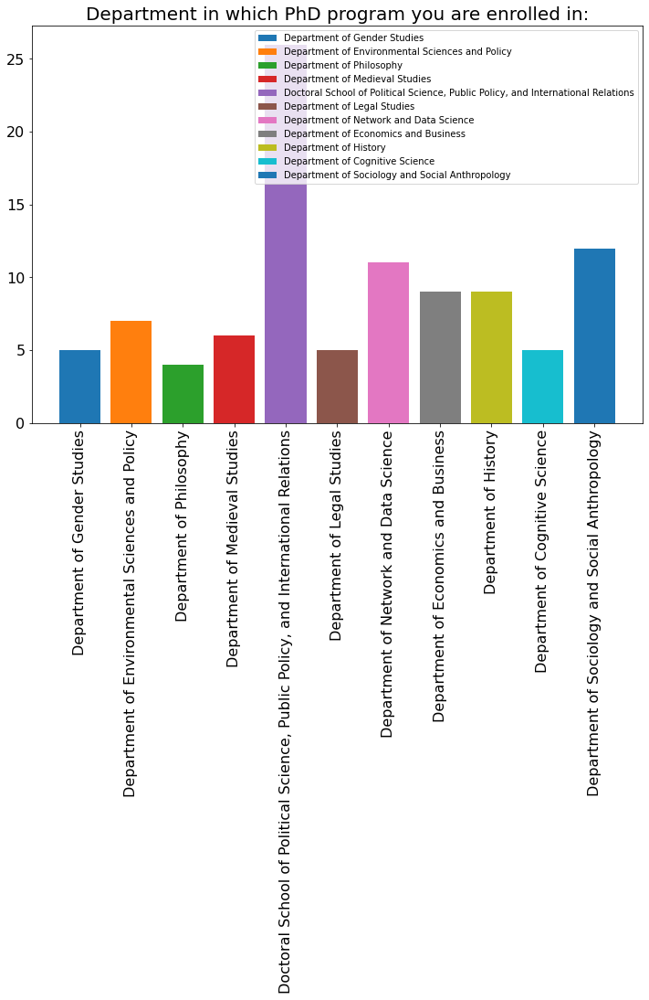

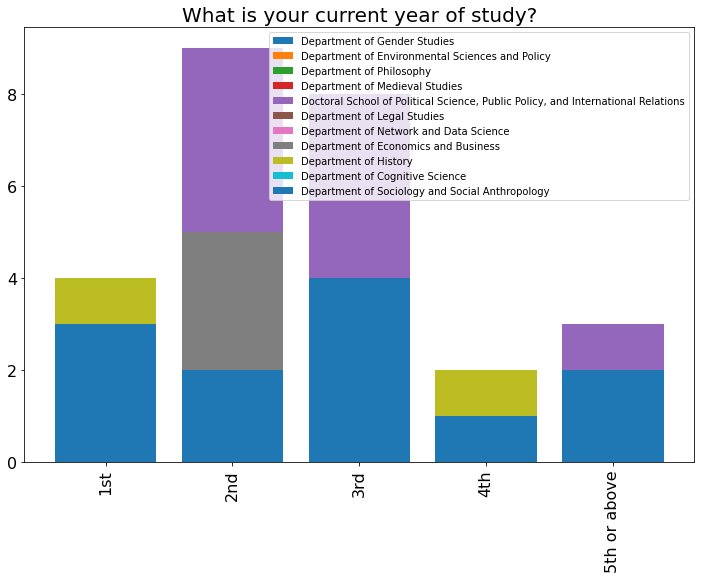

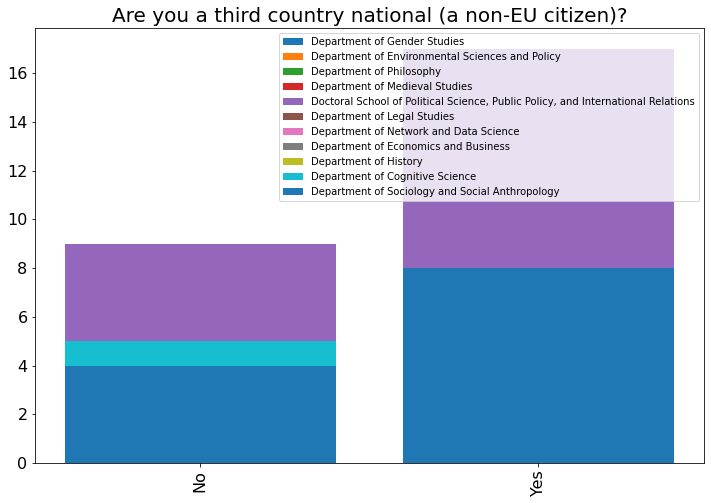

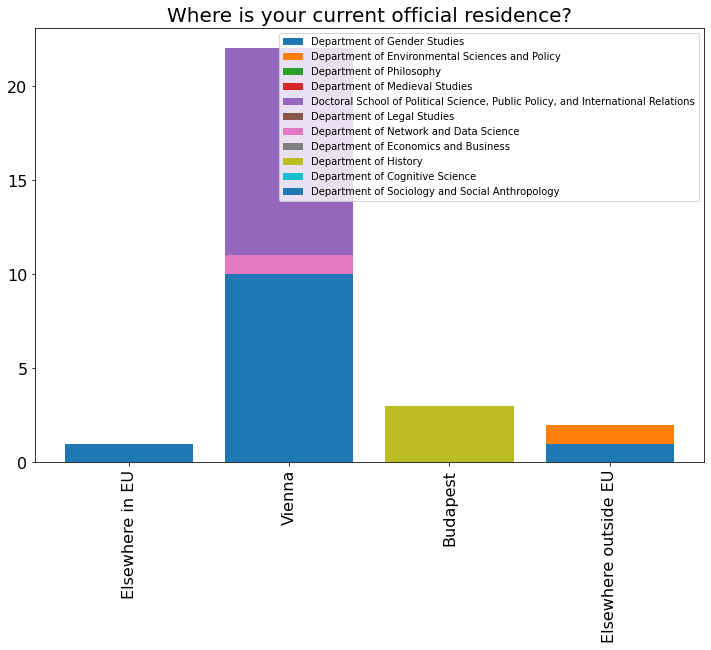

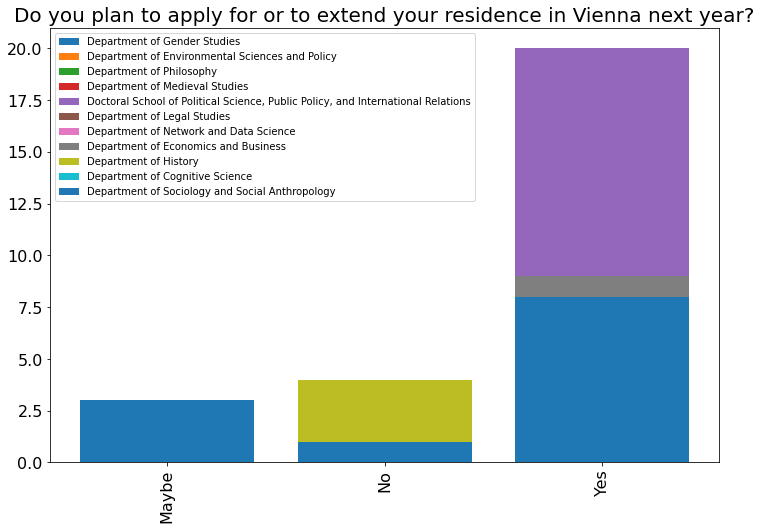

...

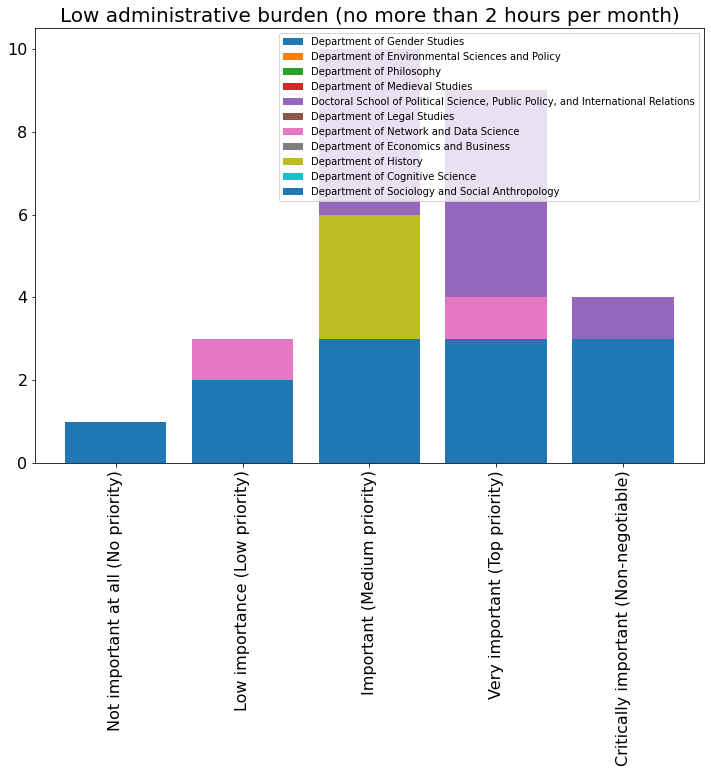

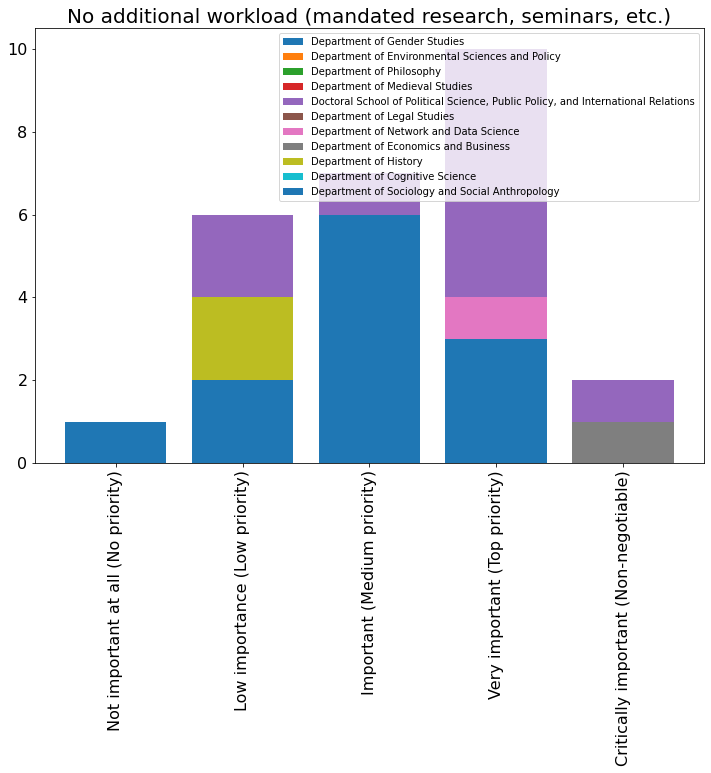

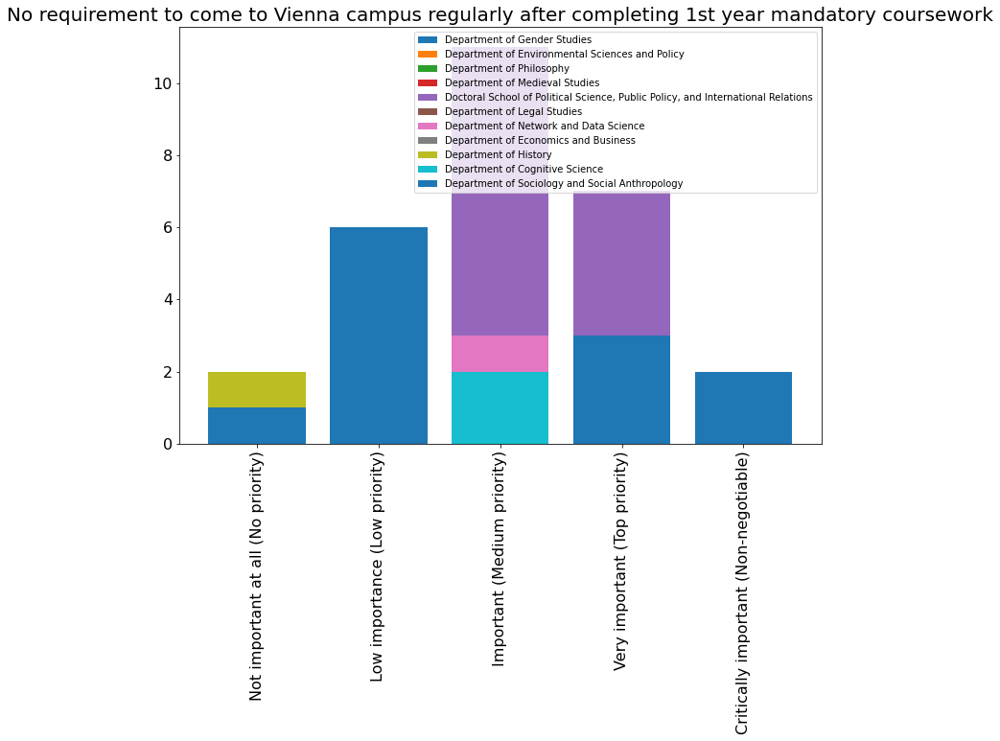

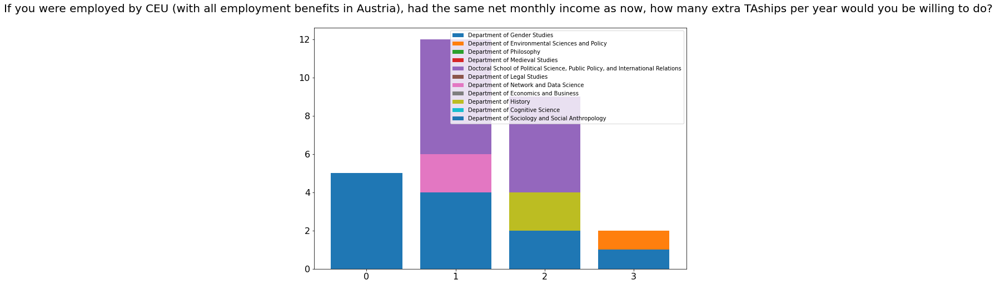

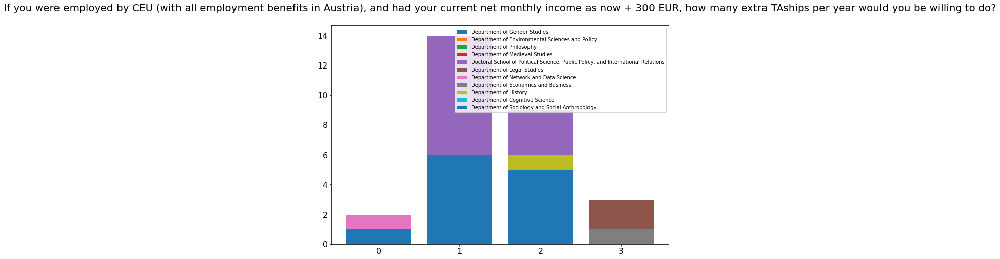

In [9]:
for i, column in enumerate(df.columns):
    plt.figure(figsize=(12,8))
    for dept in dept_list:
        sublist = df_dict[dept][column].values
        labels, counts = np.unique(sublist , return_counts=True)
        plt.bar(labels, counts,label=dept,alpha=1)
    if i>=6 and i<=26:
        print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

# Third country nationals and EU students

In [10]:
df_eu = df[df['Are you a third country national (a non-EU citizen)?'] == "No"]
df_third = df[df['Are you a third country national (a non-EU citizen)?'] == "Yes"]

6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21


<ipython-input-11-3f1e0efbdbfb>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


22
23
24
25
26


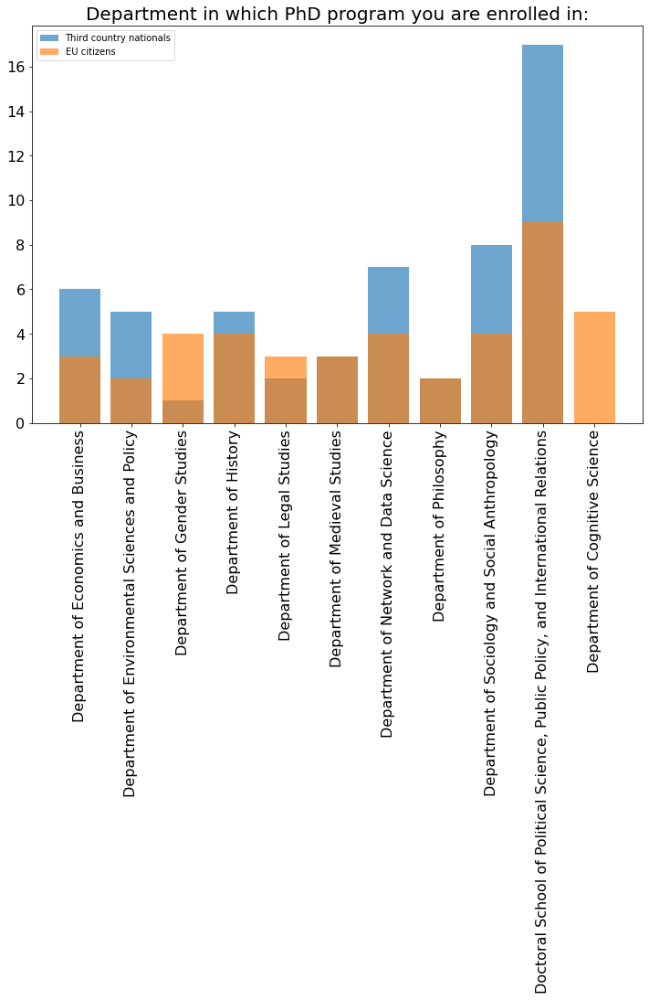

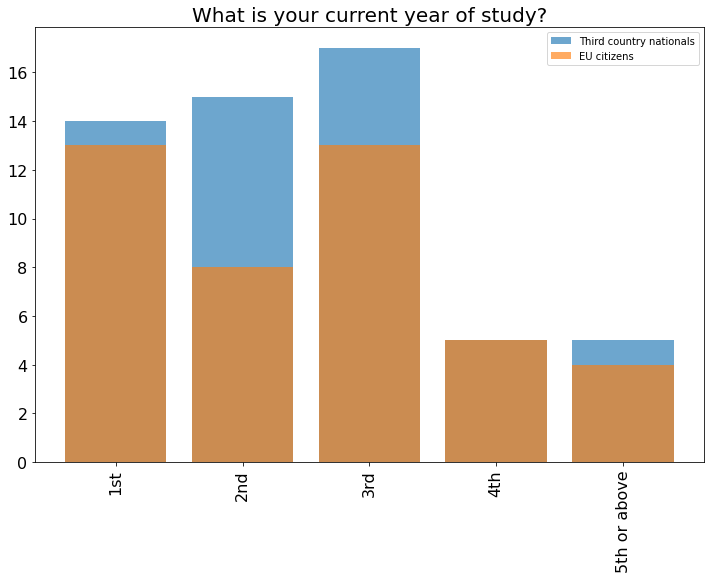

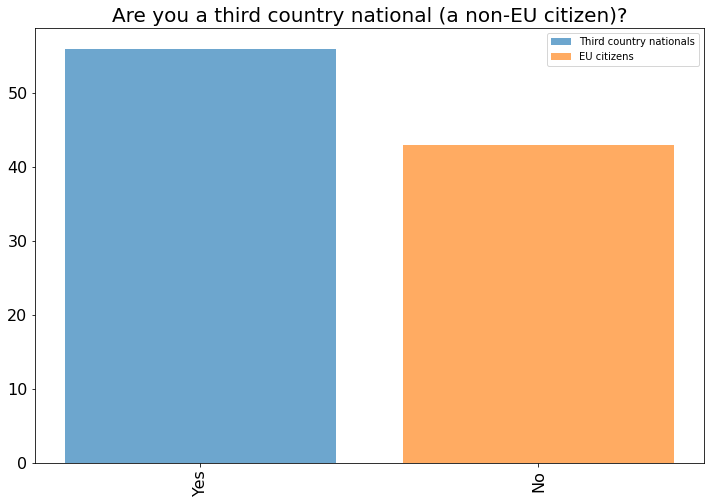

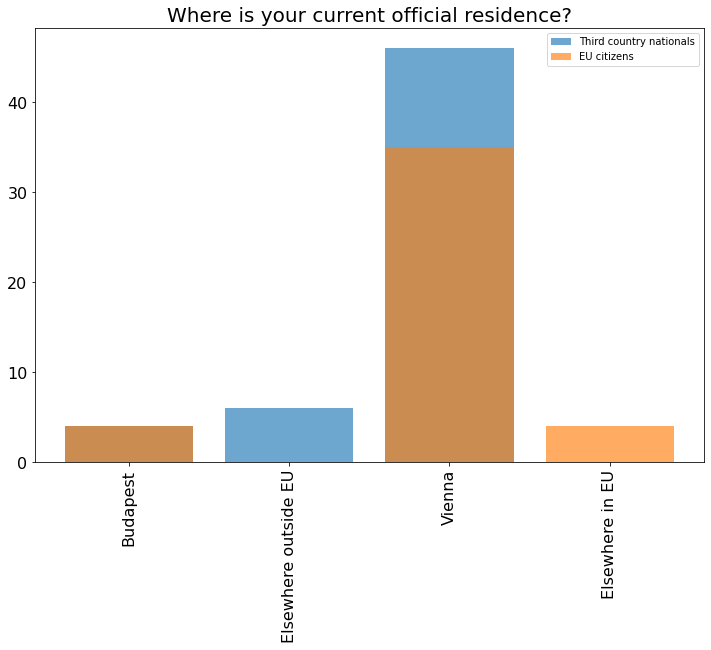

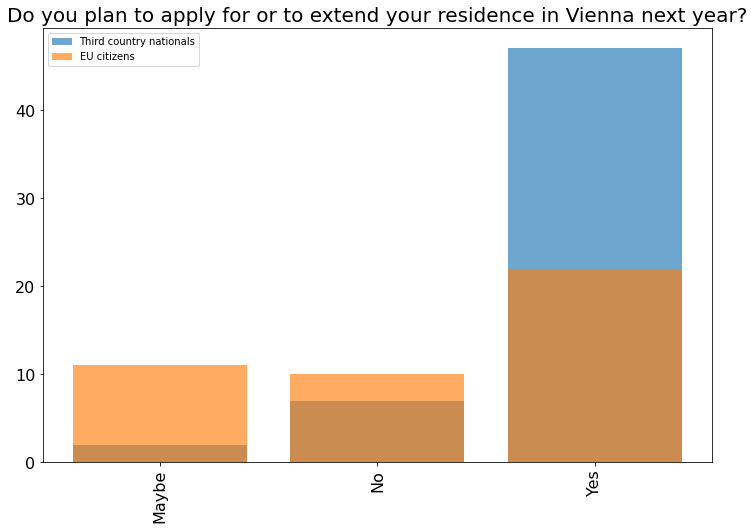

...

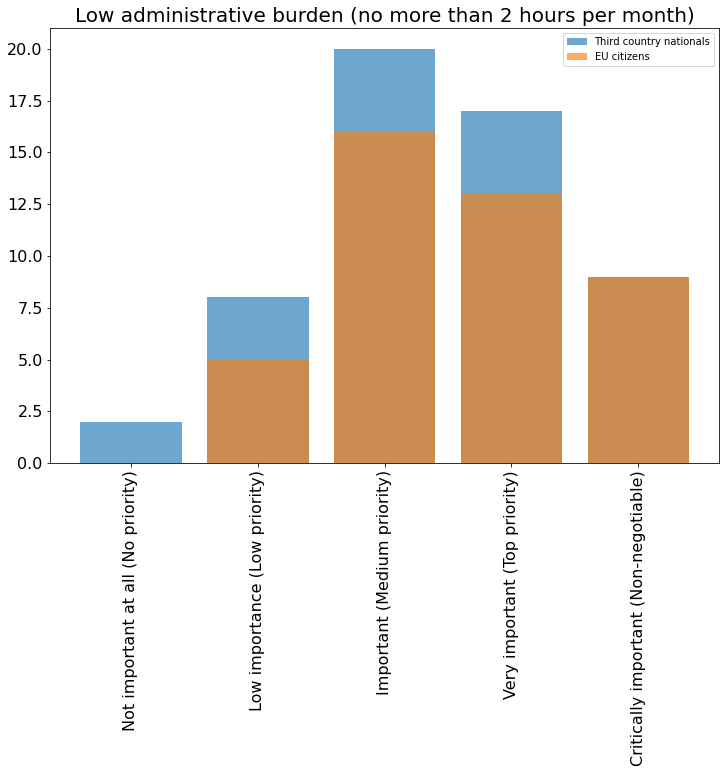

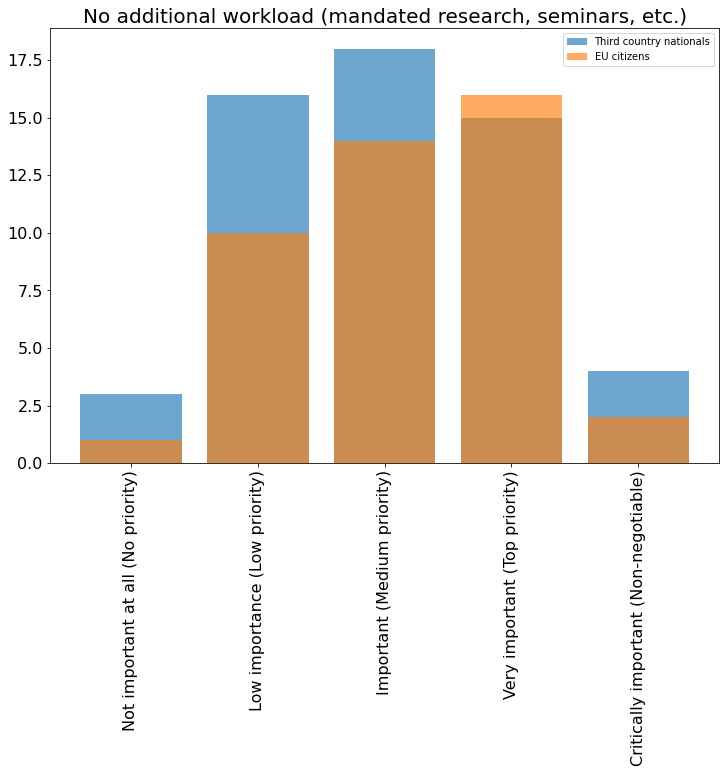

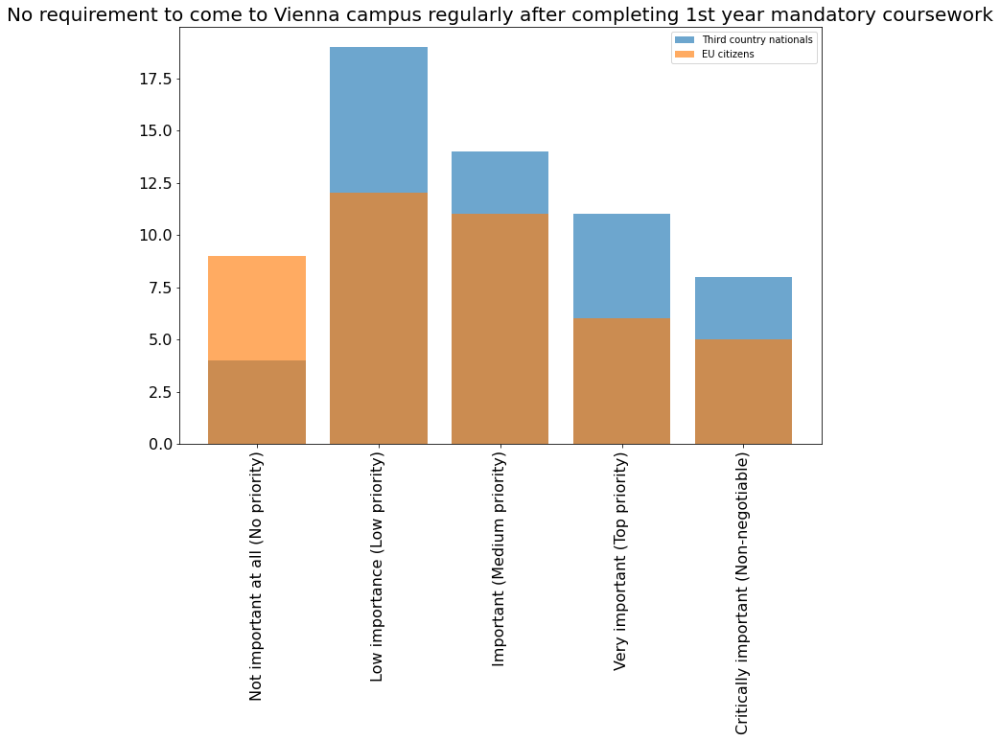

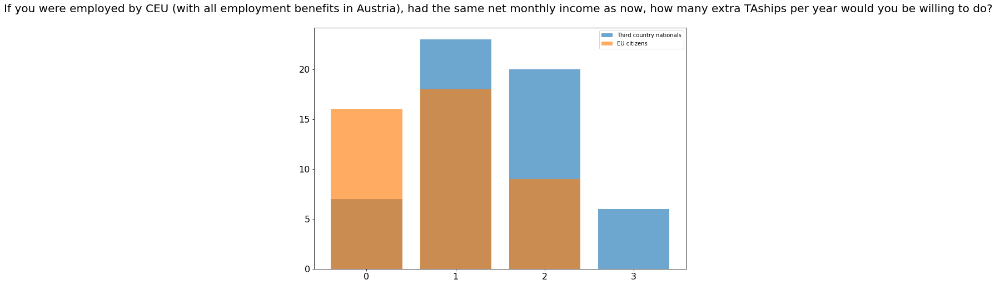

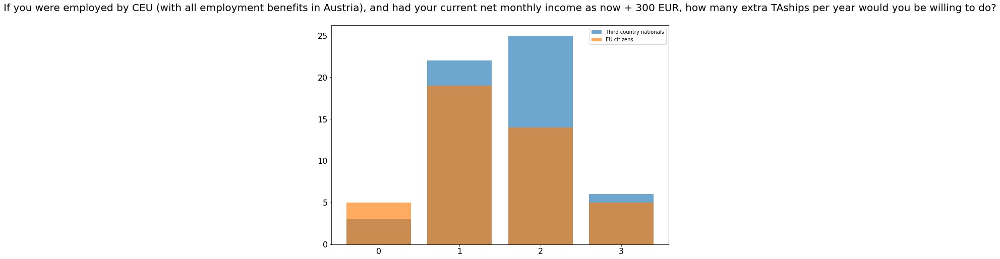

In [11]:
for i, column in enumerate(df.columns):
    sublist_eu = df_eu[[column]].values
    sublist_third = df_third[[column]].values
    sublist = df[[column]].values
    labels_third, counts_third = np.unique(sublist_third , return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels_third, counts_third,label='Third country nationals',alpha=0.65)
    labels_eu, counts_eu = np.unique(sublist_eu, return_counts=True)
    plt.bar(labels_eu,counts_eu,label="EU citizens",alpha=0.65)
    if i>=6 and i<=26:
        print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

## Residence analysis

In [12]:
df_1 = df[df['Where is your current official residence?'] == "Vienna"]
df_2 = df[df['Where is your current official residence?']== "Budapest"]
df_3 = df[(df['Where is your current official residence?']!= "Budapest") & (df['Where is your current official residence?']!= "Vienna")]

<ipython-input-13-7d94dfc67b67>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


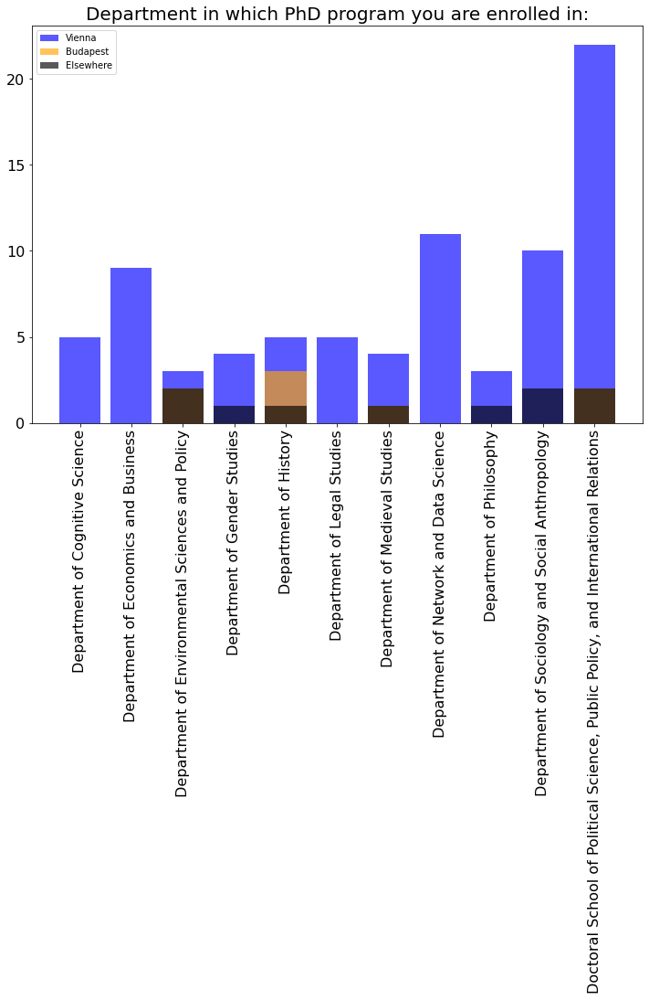

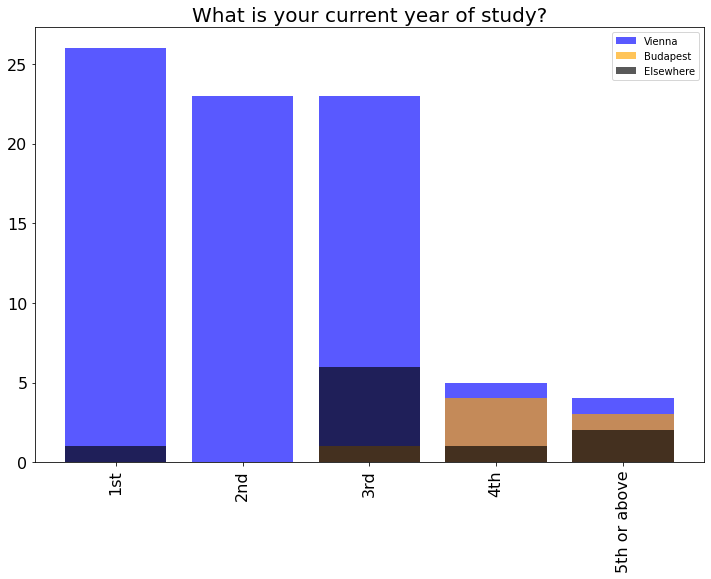

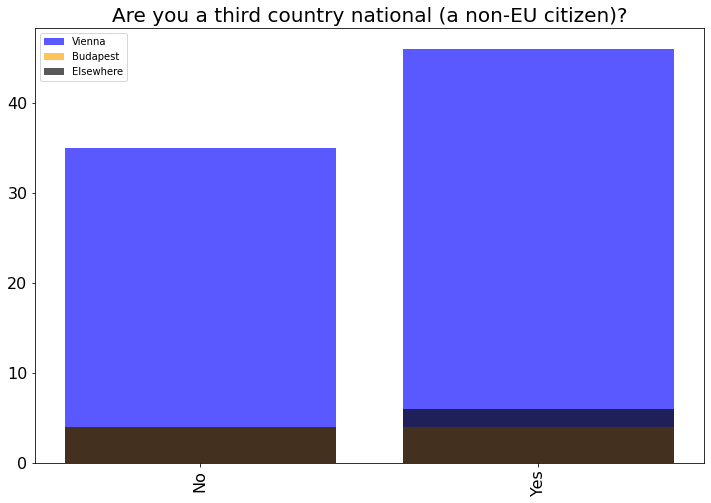

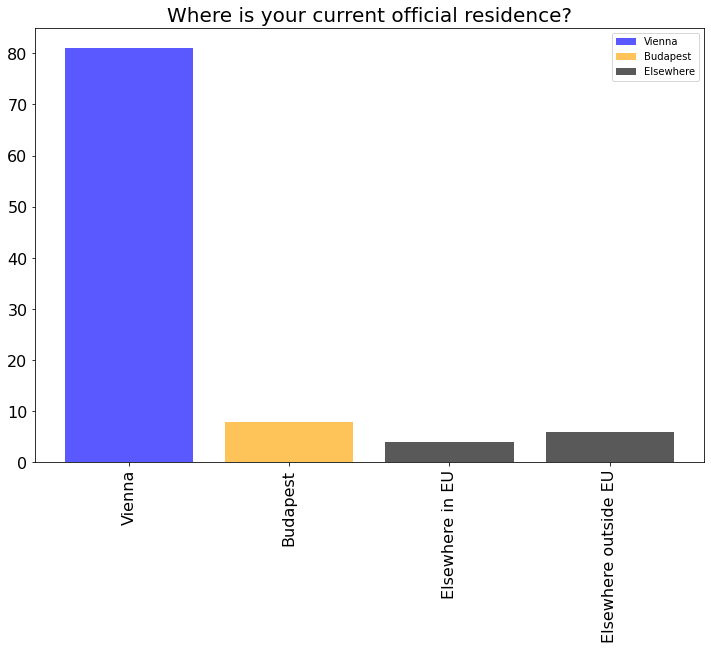

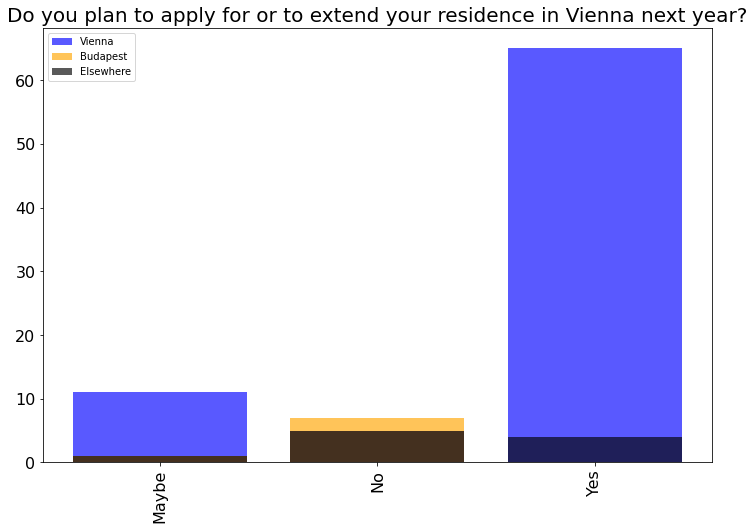

...

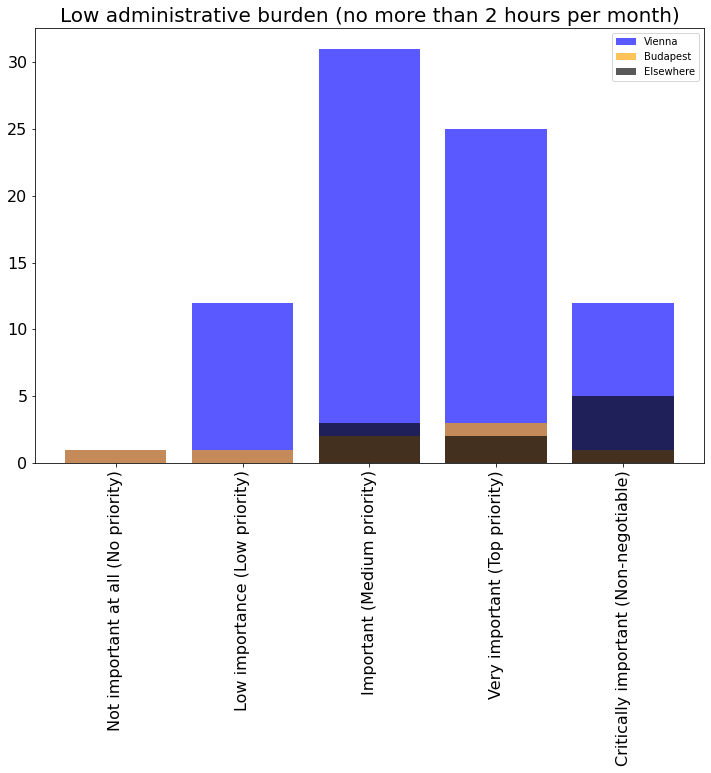

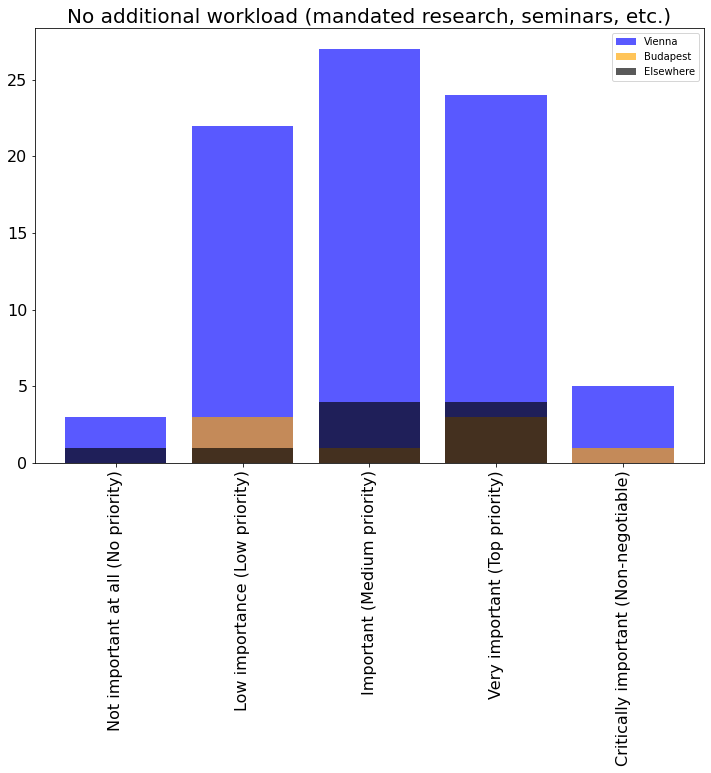

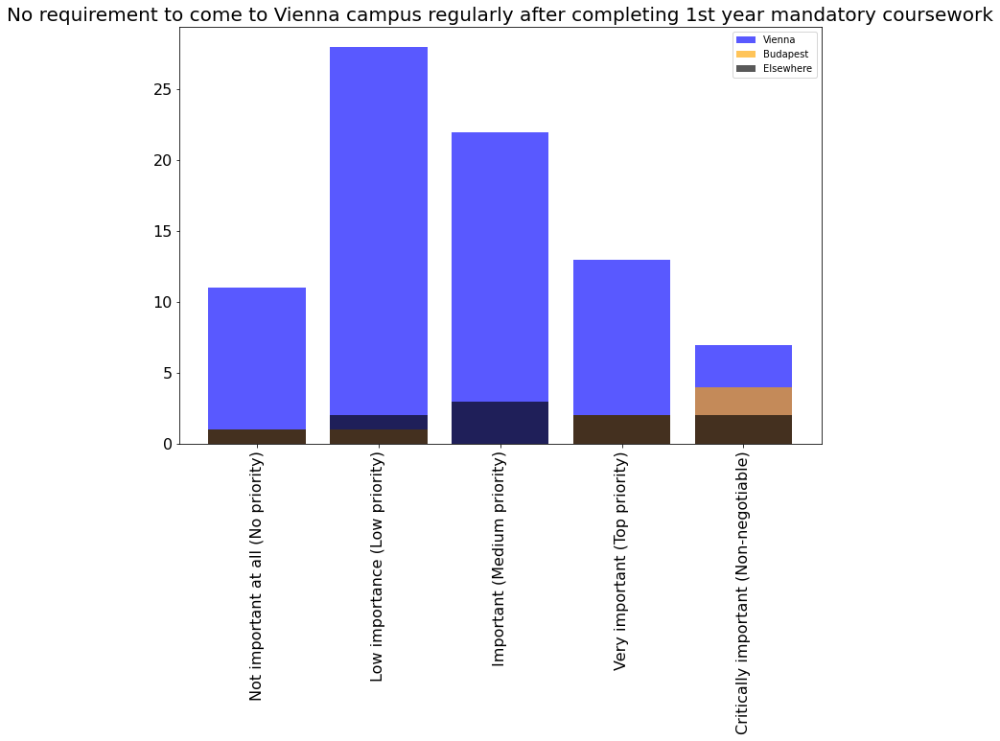

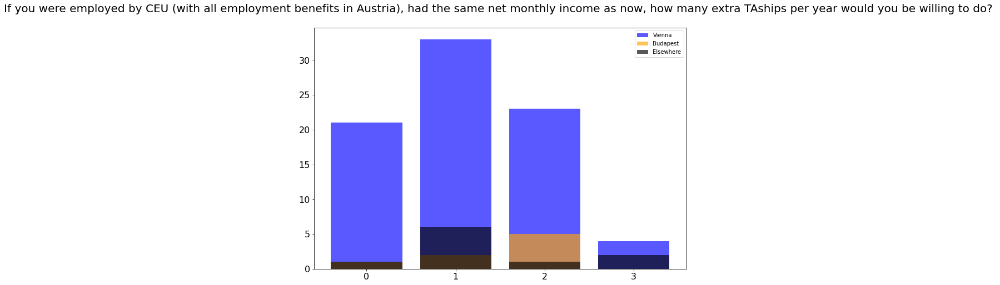

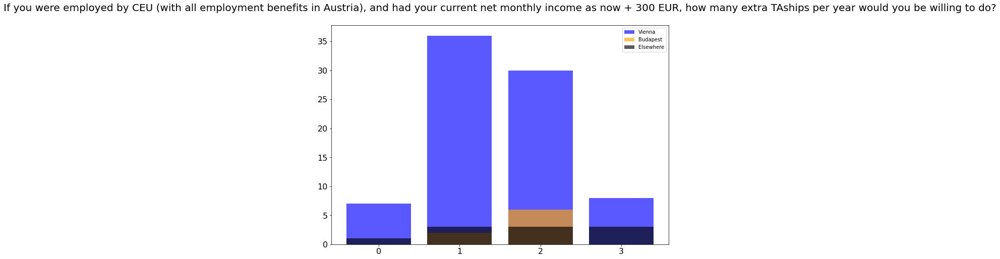

In [13]:
for i, column in enumerate(df.columns):
    sublist_1 = df_1[[column]].values
    sublist_2 = df_2[[column]].values
    sublist_3 = df_3[[column]].values
    labels_1, counts_1 = np.unique(sublist_1, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels_1, counts_1,label="Vienna",alpha=0.65,color='blue')
    labels_2, counts_2= np.unique(sublist_2, return_counts=True)
    plt.bar(labels_2,counts_2,label="Budapest",alpha=0.65,color='orange')
    labels_3, counts_3= np.unique(sublist_3, return_counts=True)
    plt.bar(labels_3,counts_3,label="Elsewhere",alpha=0.65,color='black')
    if i>=6 and i<=26:
        #print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

## Source of funding analysis

In [14]:
df_1 = df[df['What is your source of funding for your PhD studies?'] == "CEU PhD stipend\xa0"]
df_2 = df[df['What is your source of funding for your PhD studies?']!= "CEU PhD stipend\xa0"]

<ipython-input-15-0c35f60cfbb5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


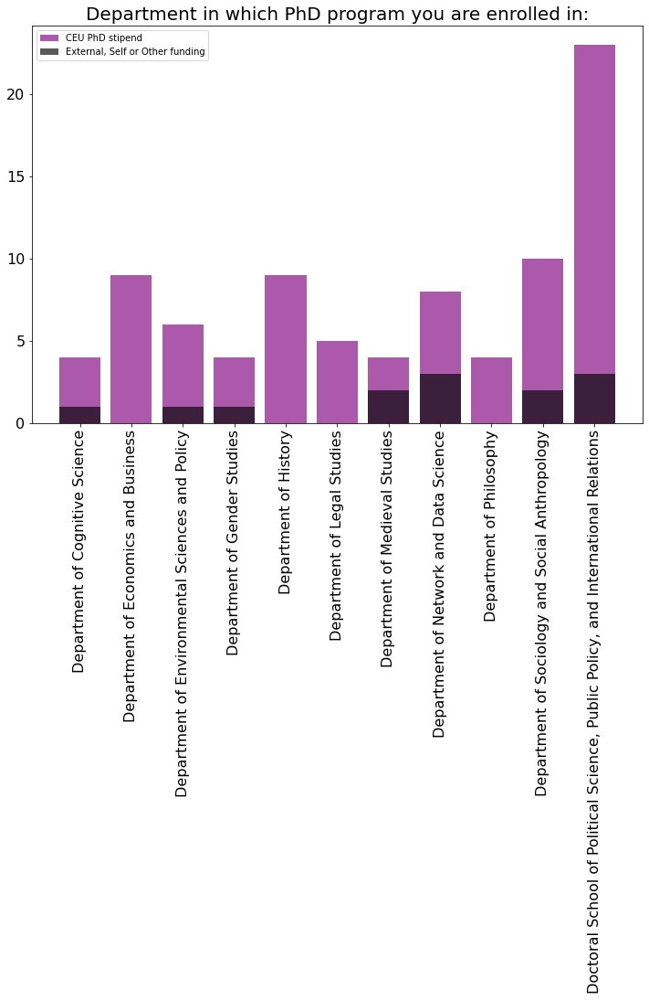

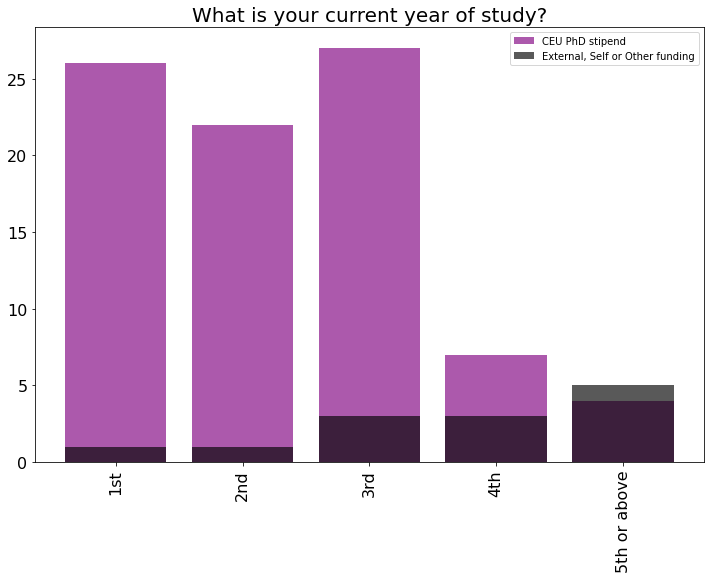

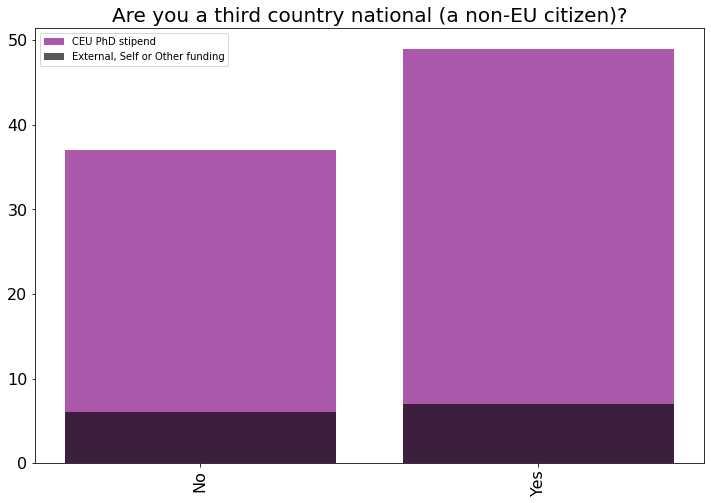

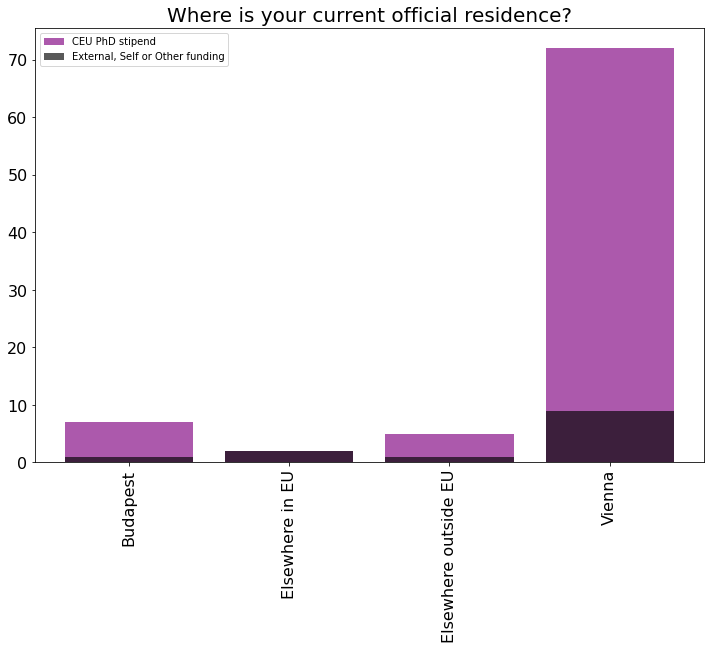

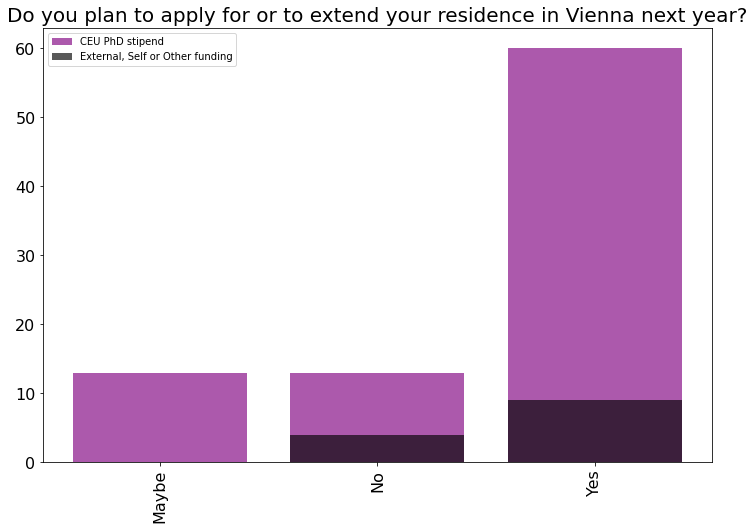

...

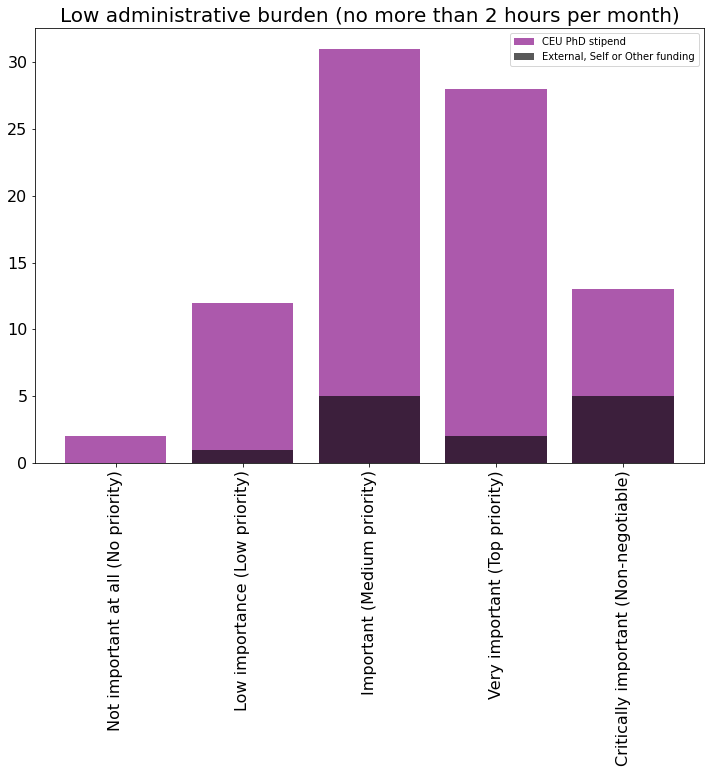

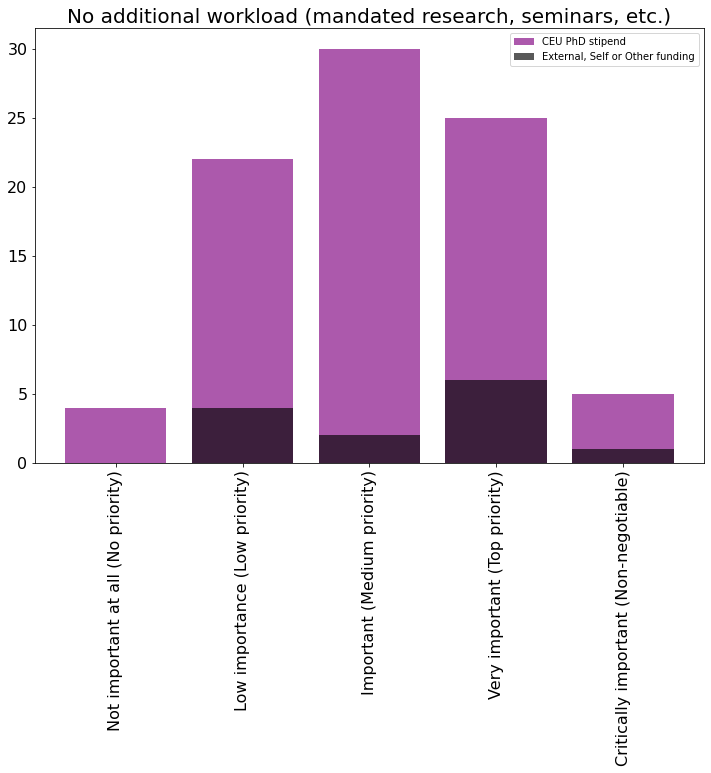

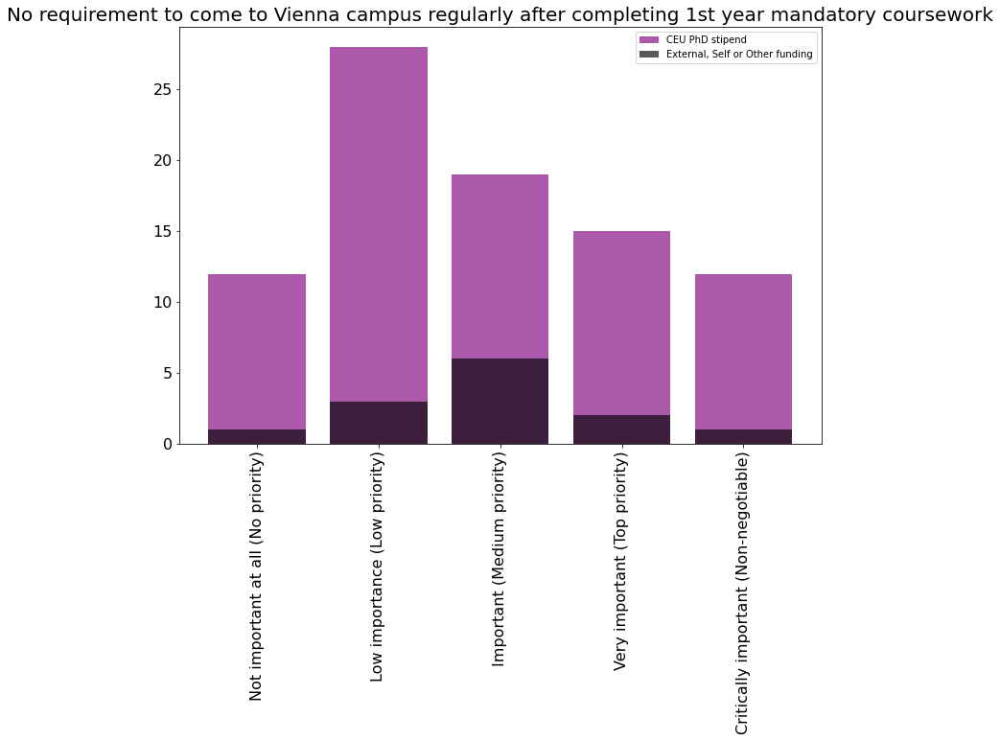

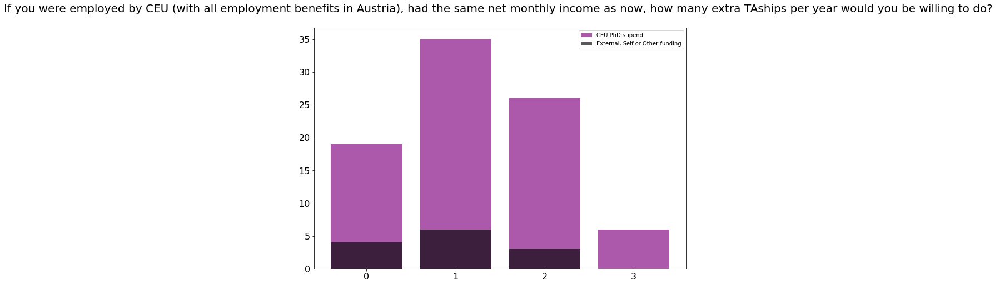

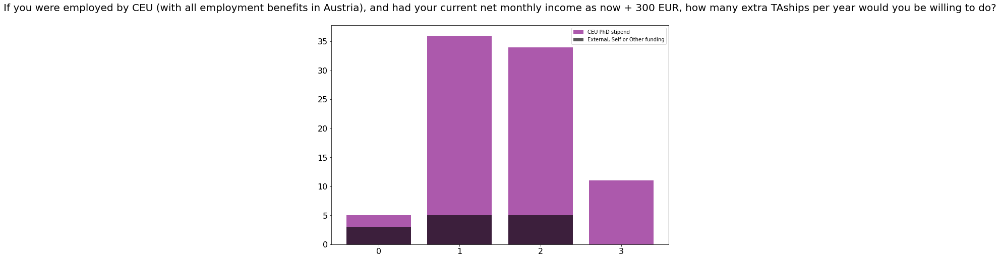

In [15]:
for i, column in enumerate(df.columns):
    sublist_1 = df_1[[column]].values
    sublist_2 = df_2[[column]].values
    labels_1, counts_1 = np.unique(sublist_1, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels_1, counts_1,label="CEU PhD stipend",alpha=0.65,color='purple')
    labels_2, counts_2= np.unique(sublist_2, return_counts=True)
    plt.bar(labels_2,counts_2,label="External, Self or Other funding",alpha=0.65,color='black')
    if i>=6 and i<=26:
        #print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

## Year of study analysis

In [16]:
df_1 = df[df['What is your current year of study?'] == "1st"]
df_2 = df[df['What is your current year of study?'] == "2nd"]
df_3 = df[df['What is your current year of study?'] == "3rd"]
df_4 = df[df['What is your current year of study?'] == "4th"]
df_5 = df[df['What is your current year of study?'] == "5th or above"]

<ipython-input-17-a67e8b0d22f4>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


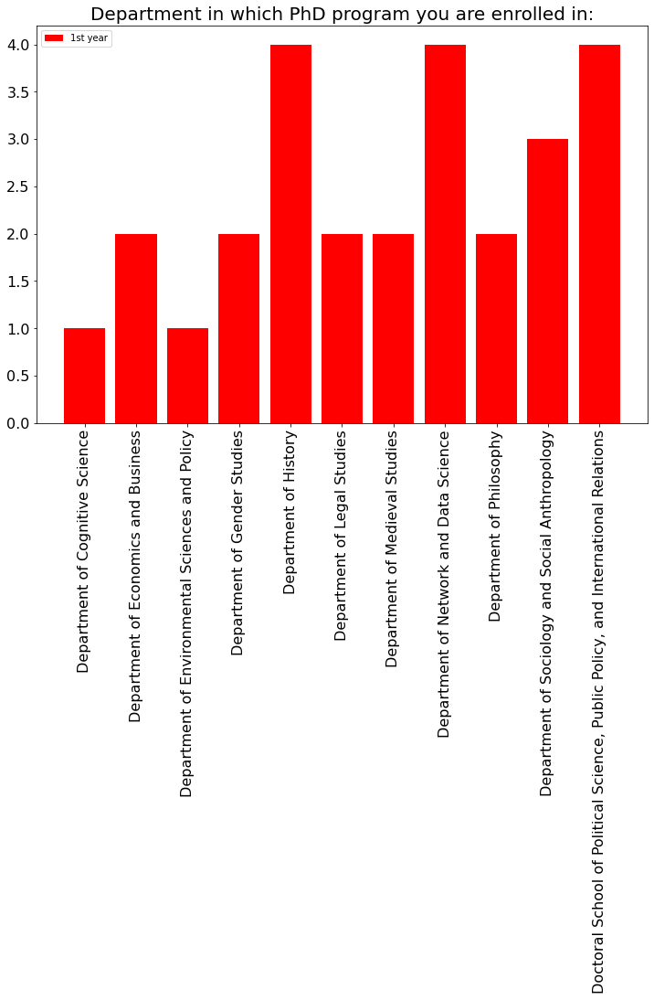

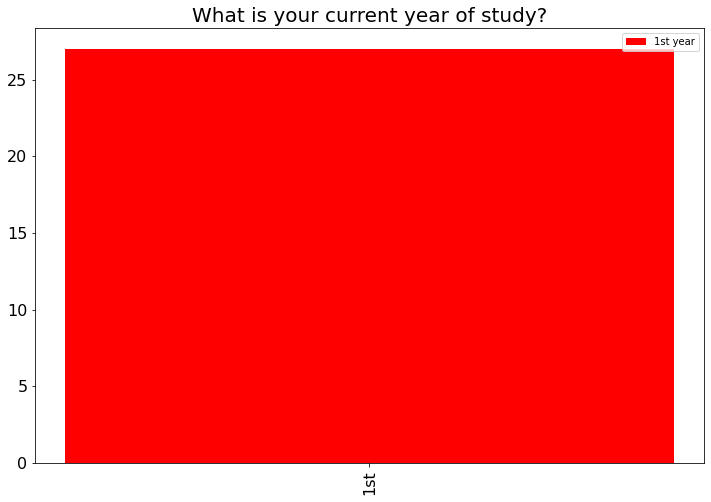

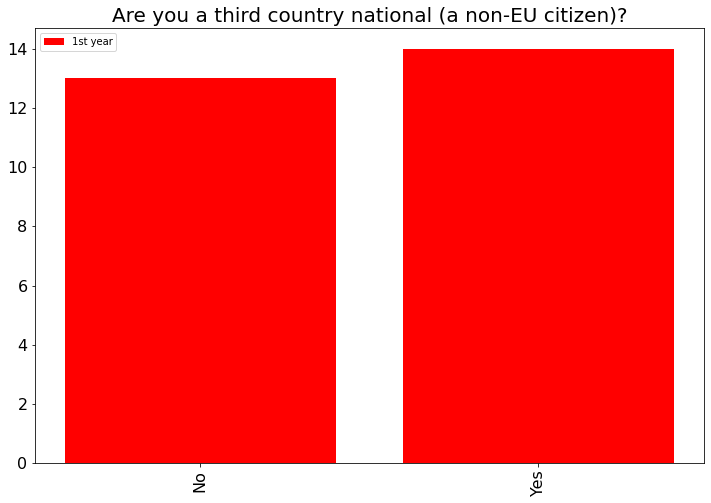

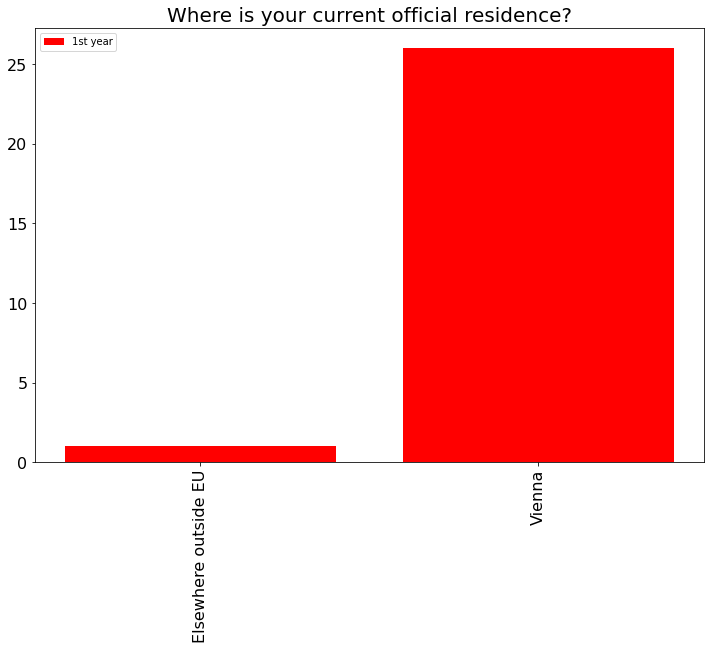

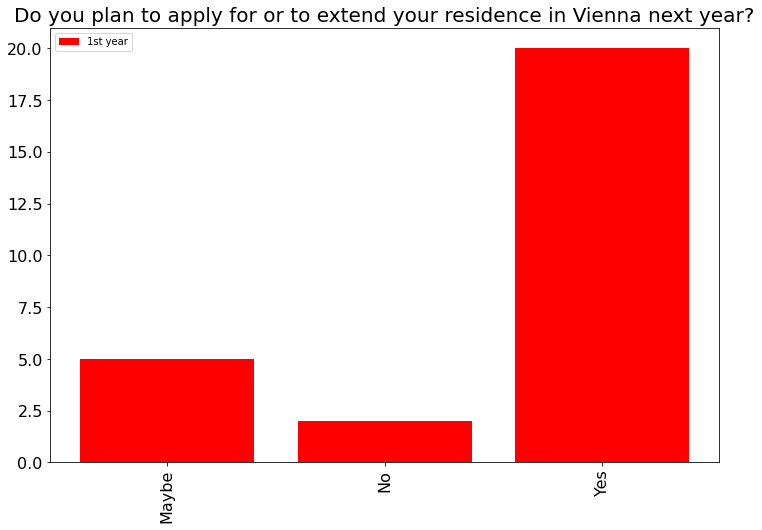

...

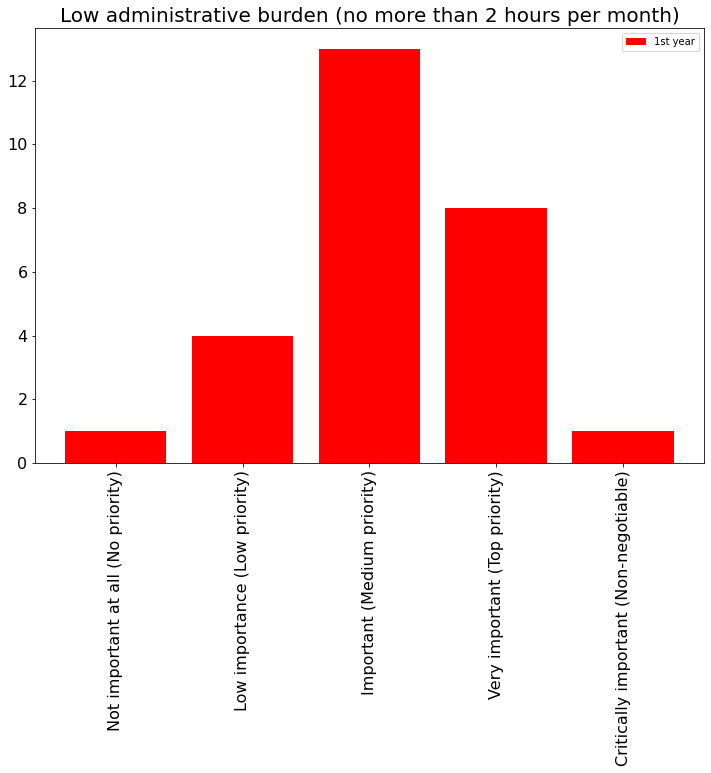

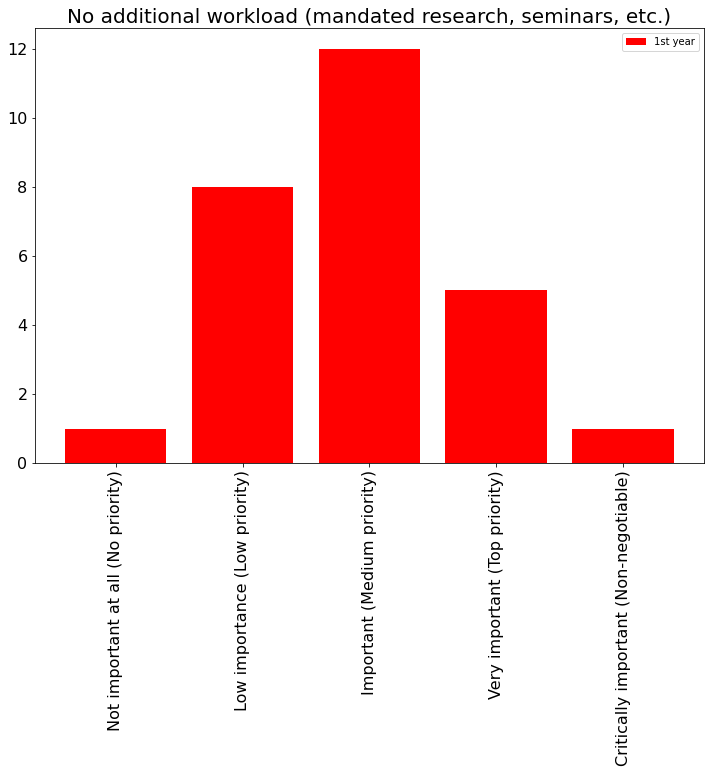

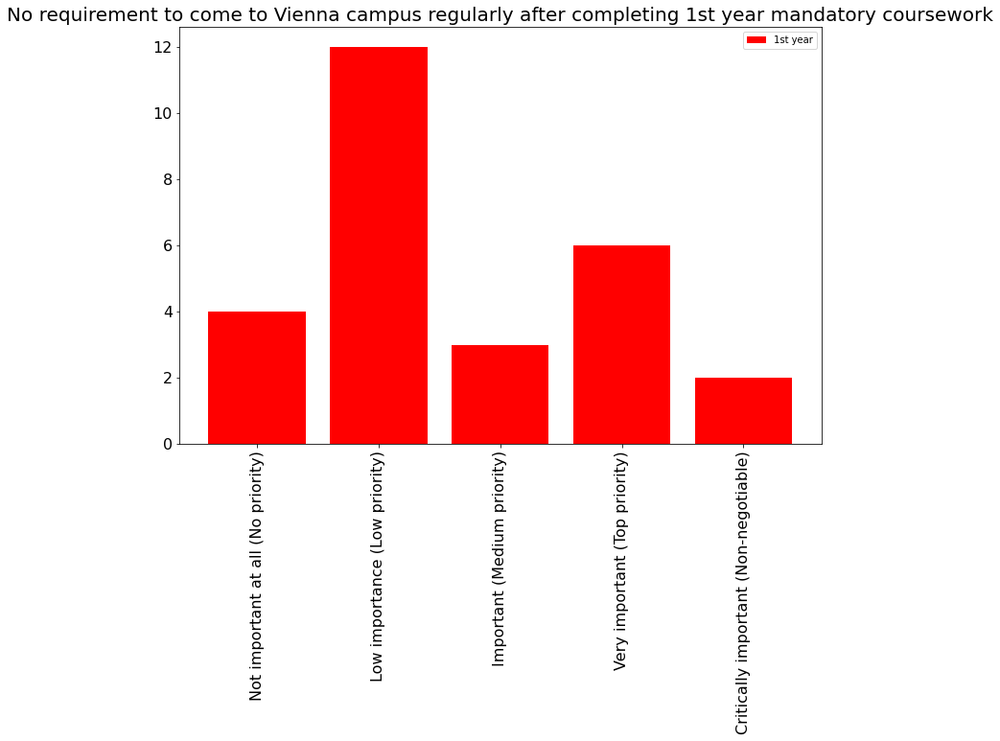

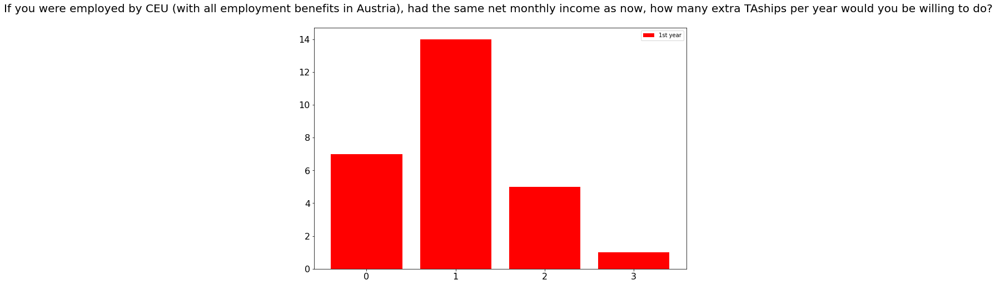

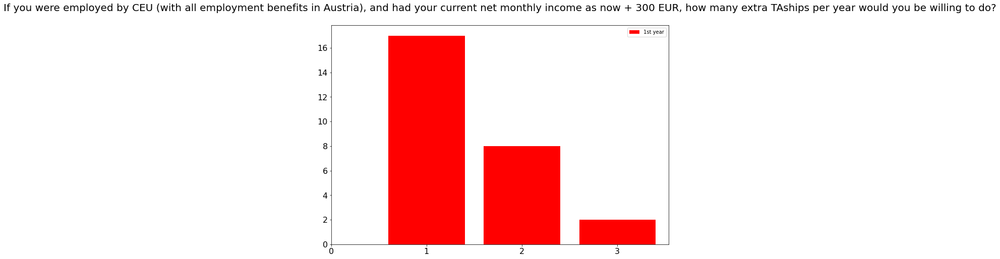

In [17]:
for i, column in enumerate(df.columns):
    #print(i)
    sublist = df_1[[column]].values
    labels, counts = np.unique(sublist, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels, counts,label='1st year', color='red')
    if i>=6 and i<=26:
        #print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

<ipython-input-18-86ccb7591199>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


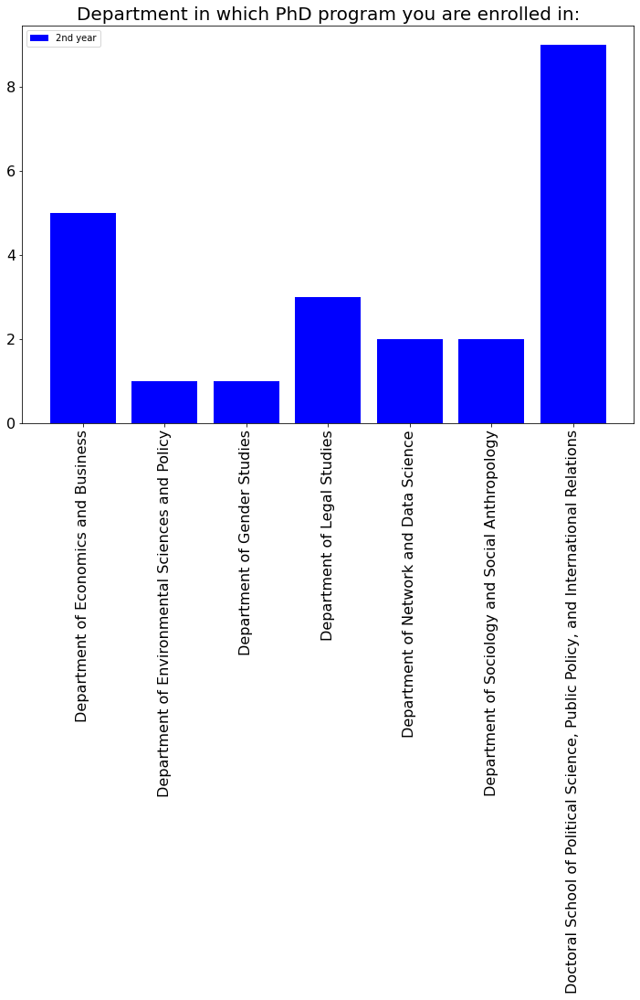

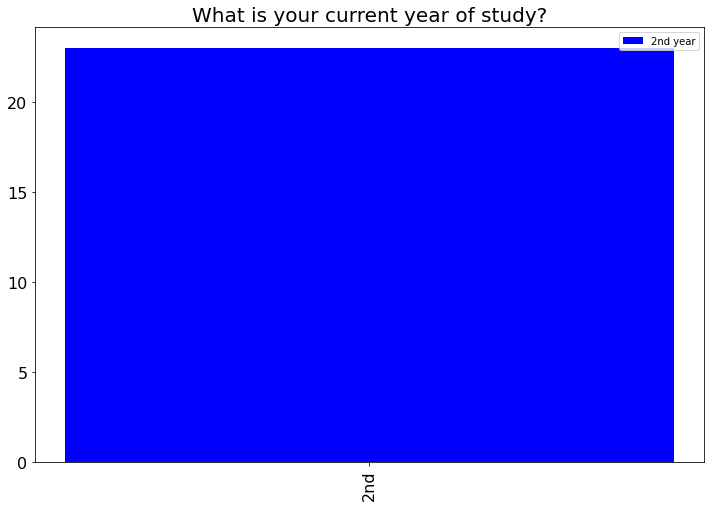

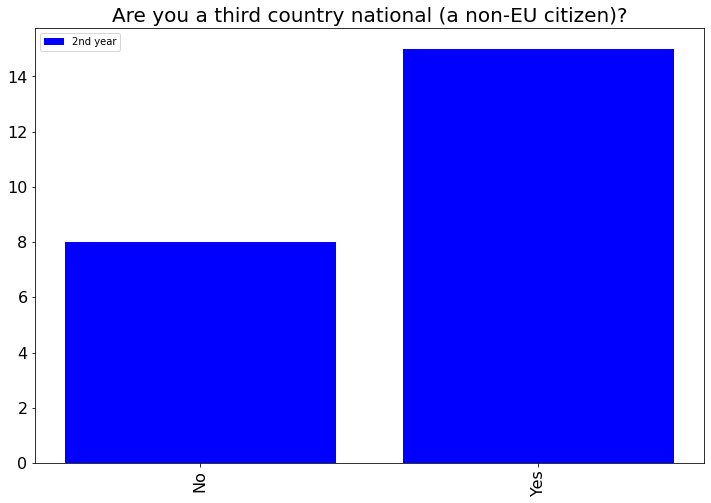

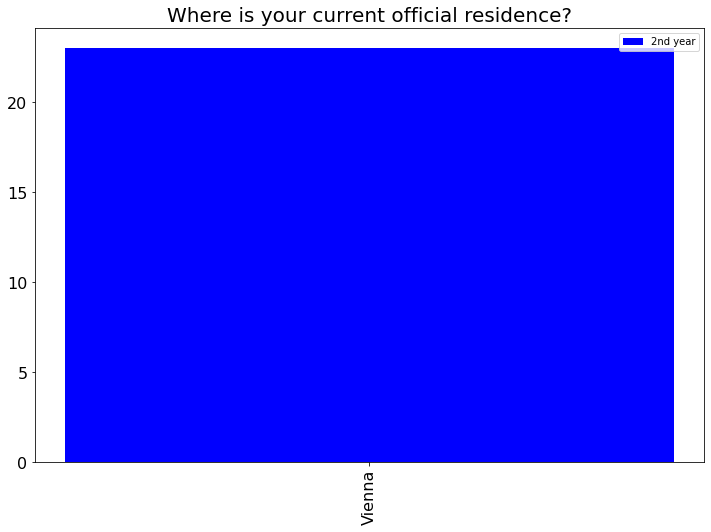

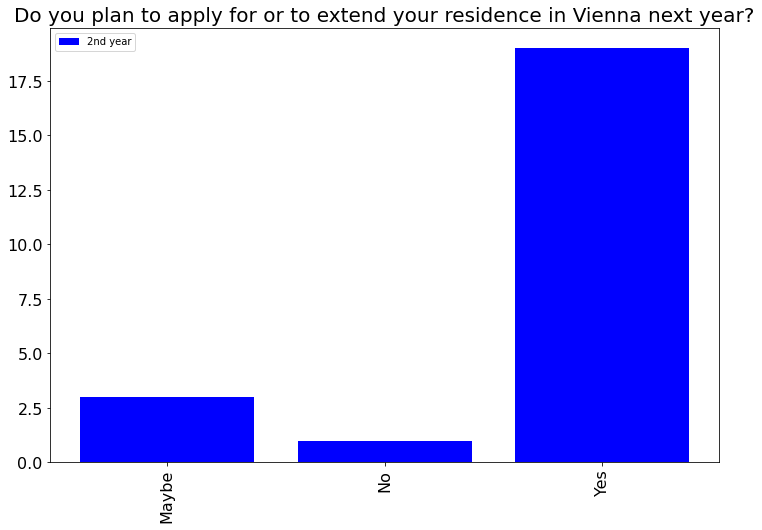

...

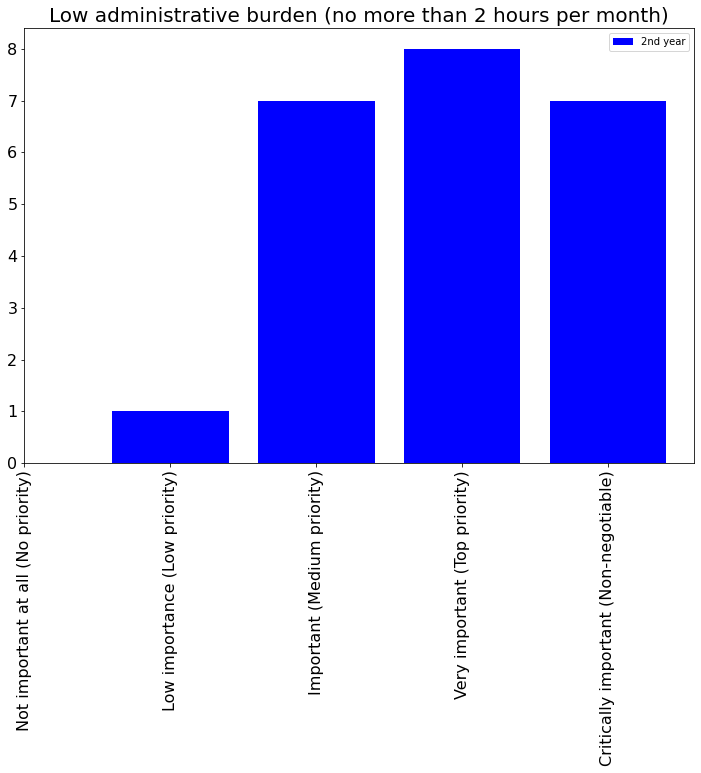

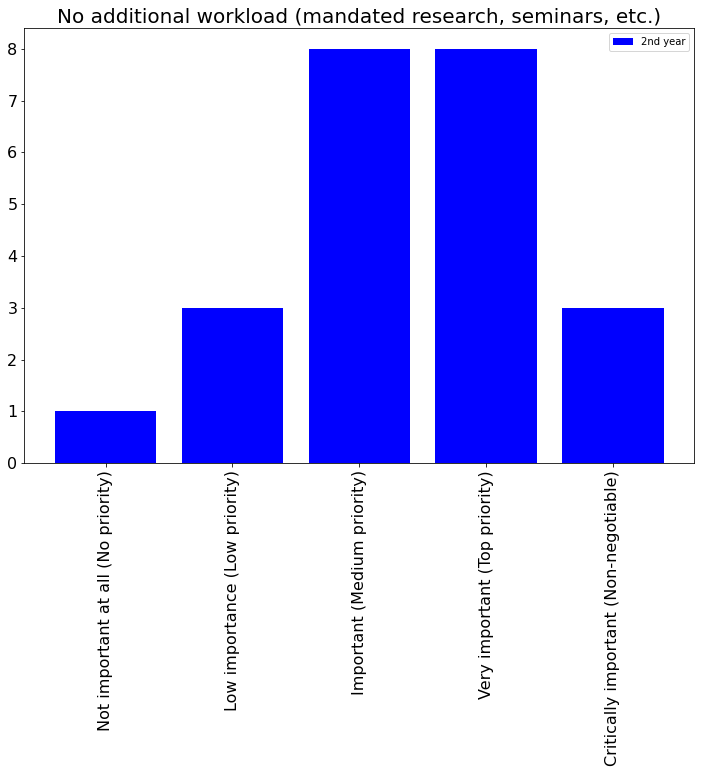

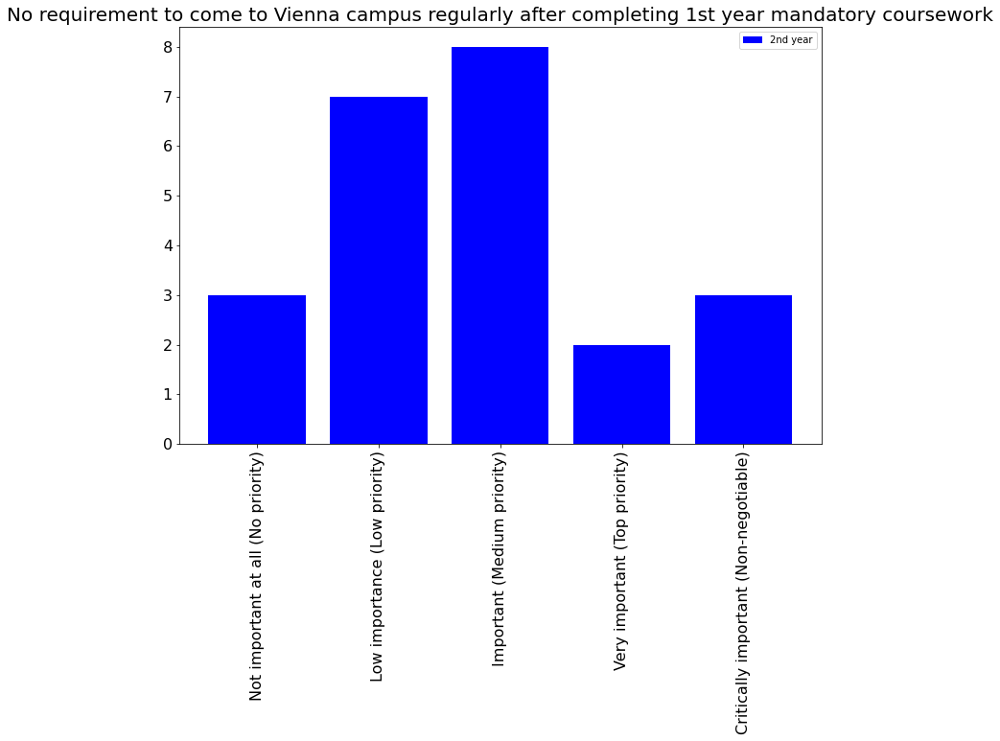

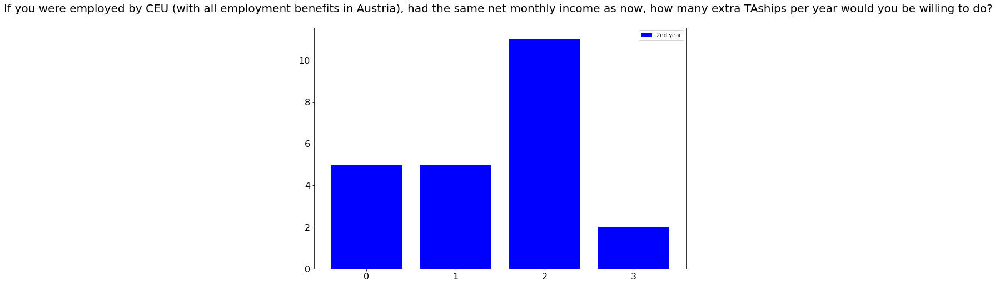

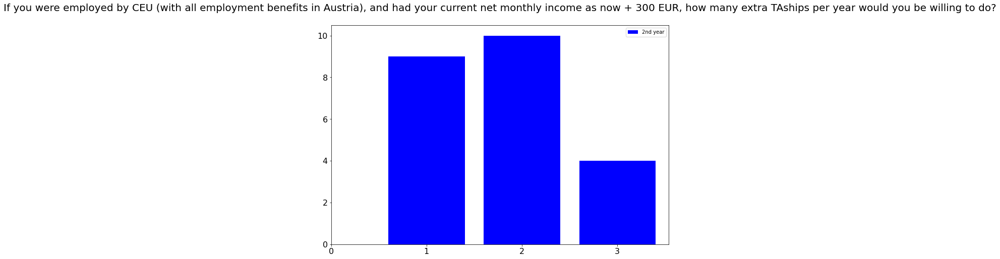

In [18]:
for i, column in enumerate(df.columns):
    #print(i)
    sublist = df_2[[column]].values
    labels, counts = np.unique(sublist, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels, counts,label='2nd year', color='blue')
    if i>=6 and i<=26:
        #print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

<ipython-input-19-405eb8052bc4>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


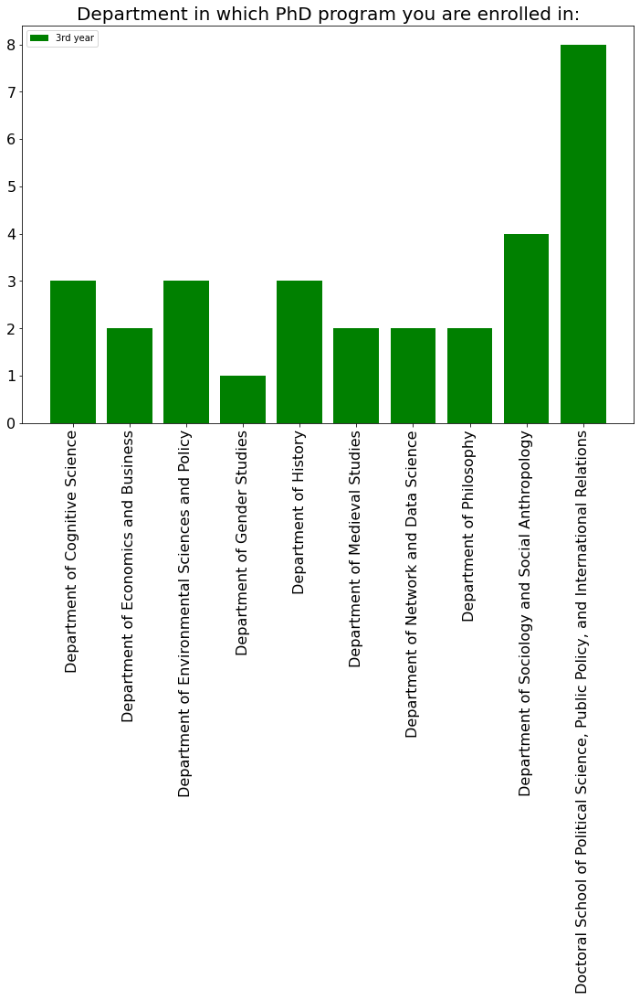

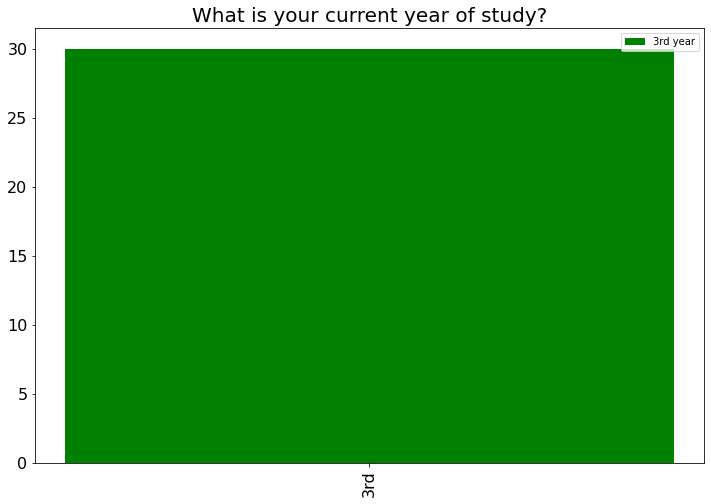

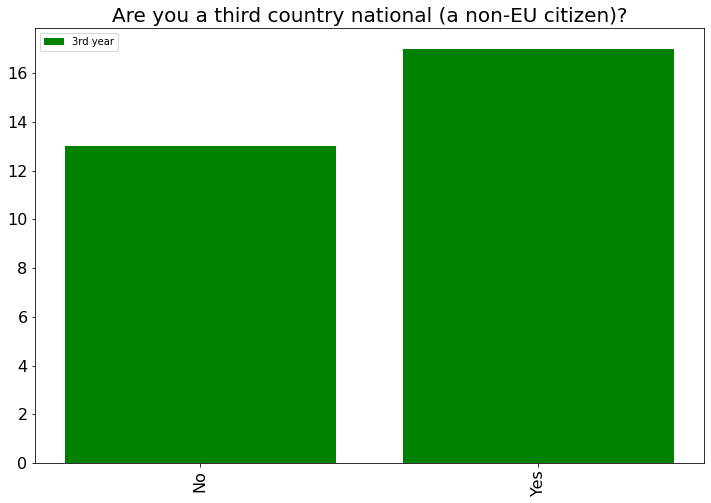

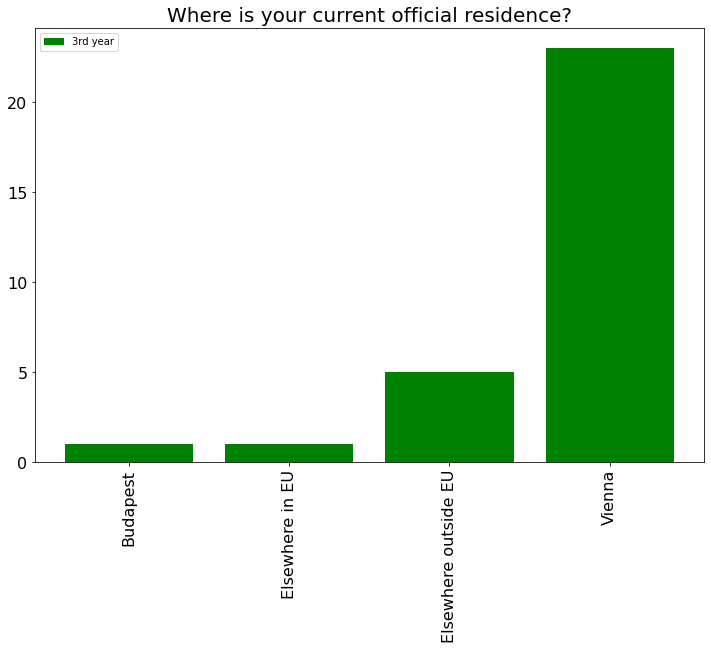

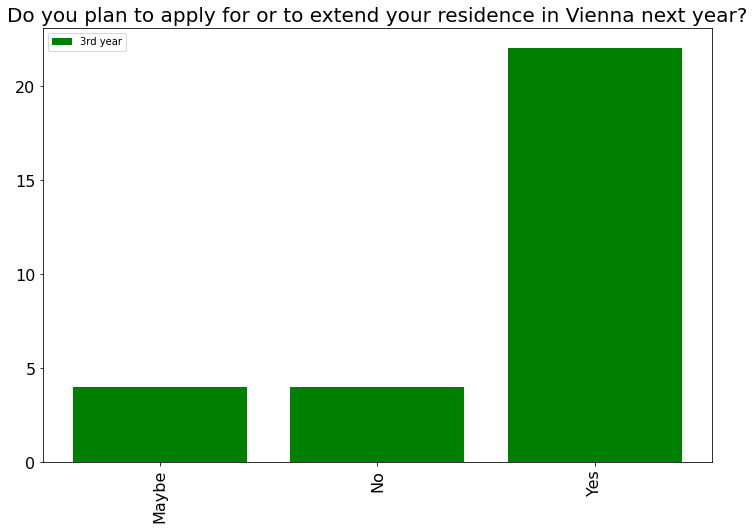

...

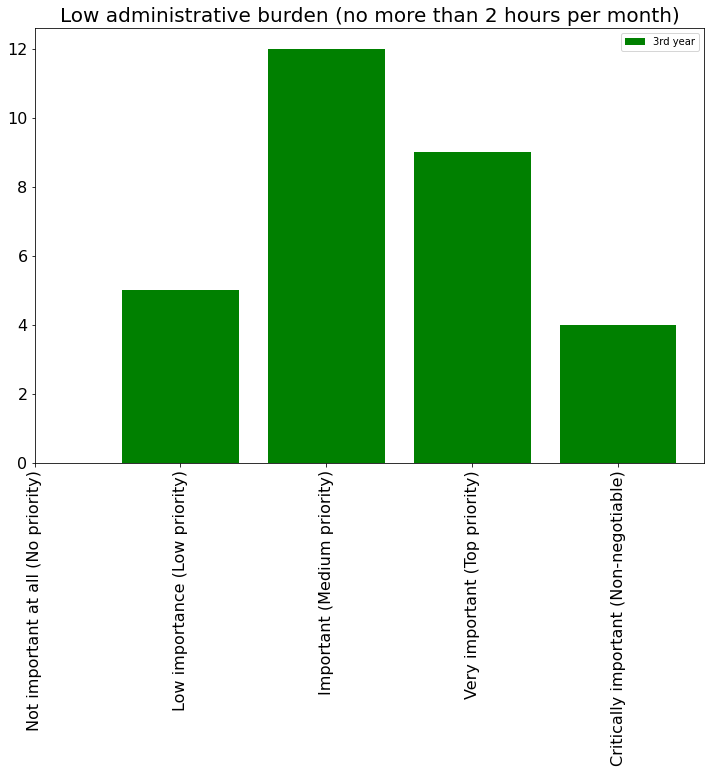

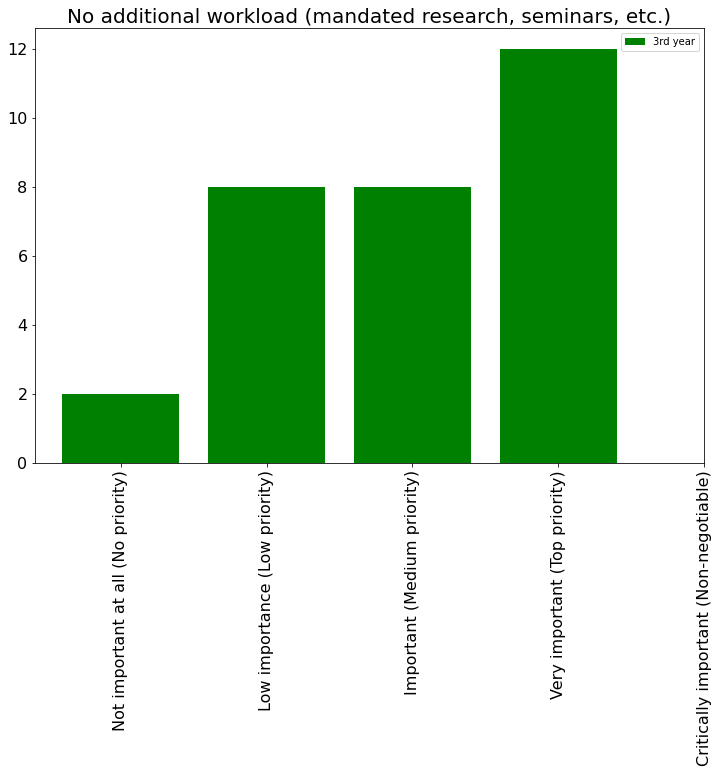

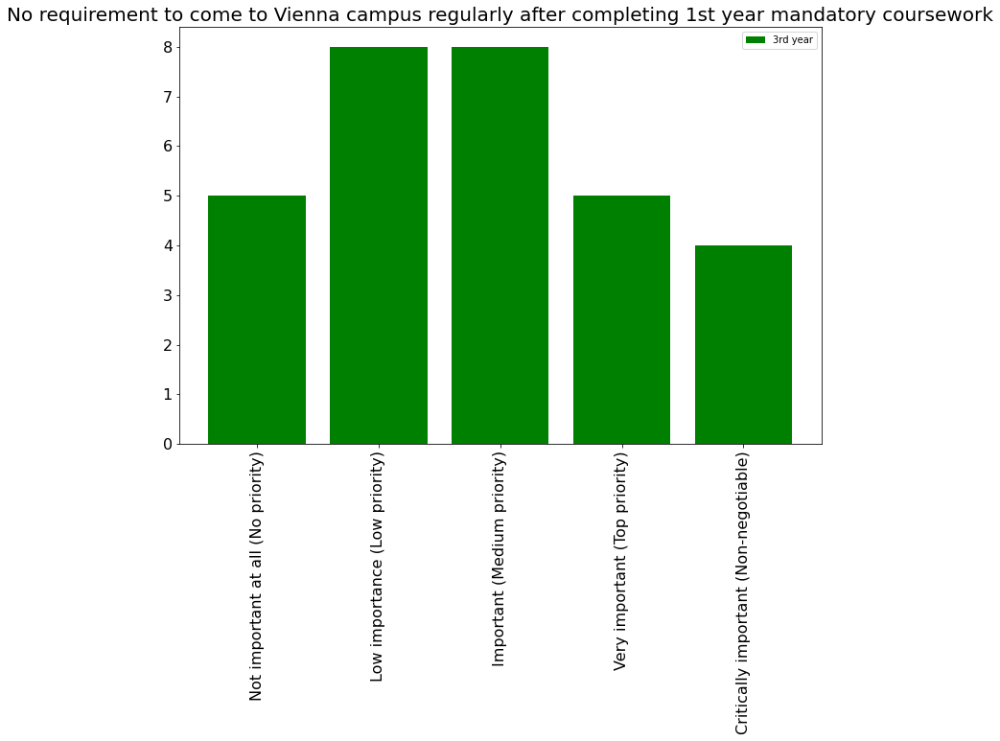

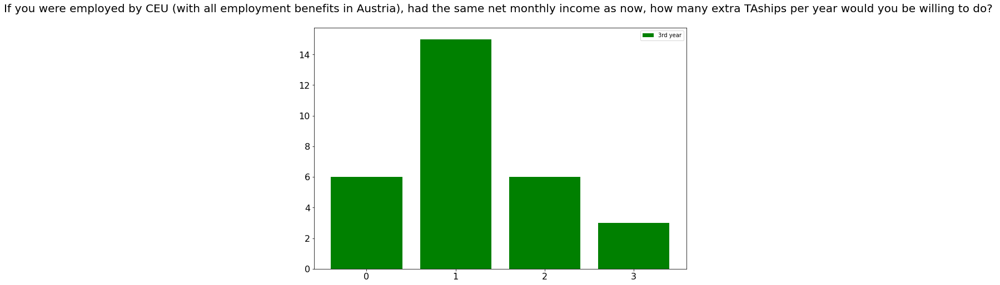

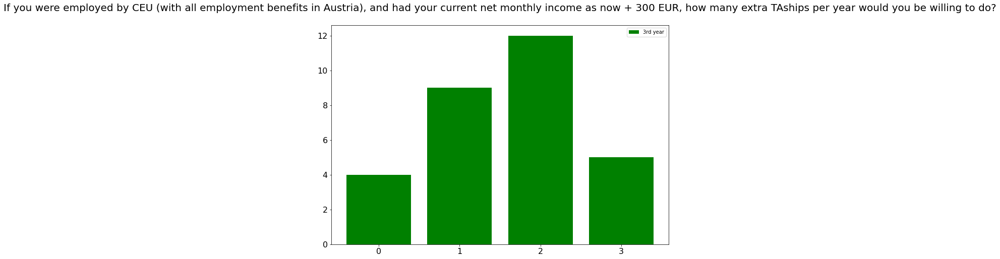

In [19]:
for i, column in enumerate(df.columns):
    #print(i)
    sublist = df_3[[column]].values
    labels, counts = np.unique(sublist, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels, counts,label='3rd year', color='green')
    if i>=6 and i<=26:
        #print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

<ipython-input-20-9c38d663f087>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


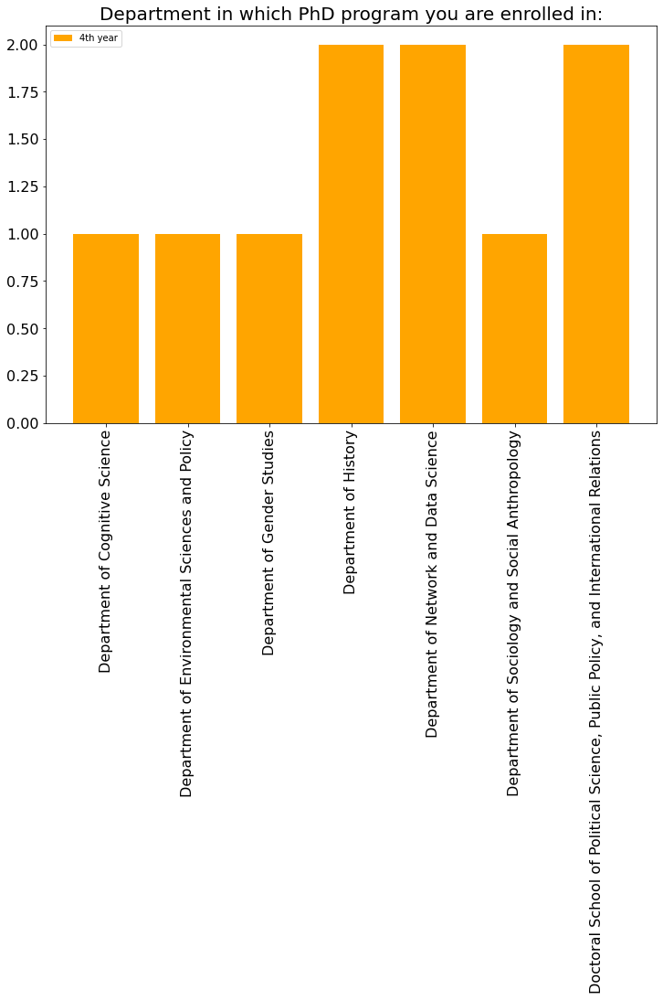

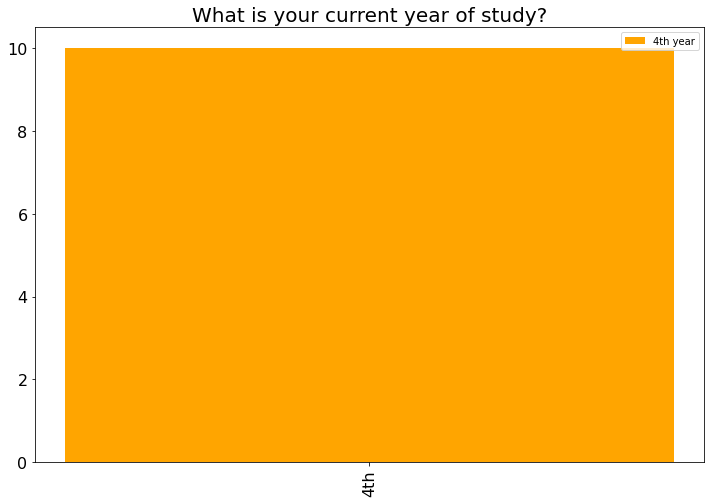

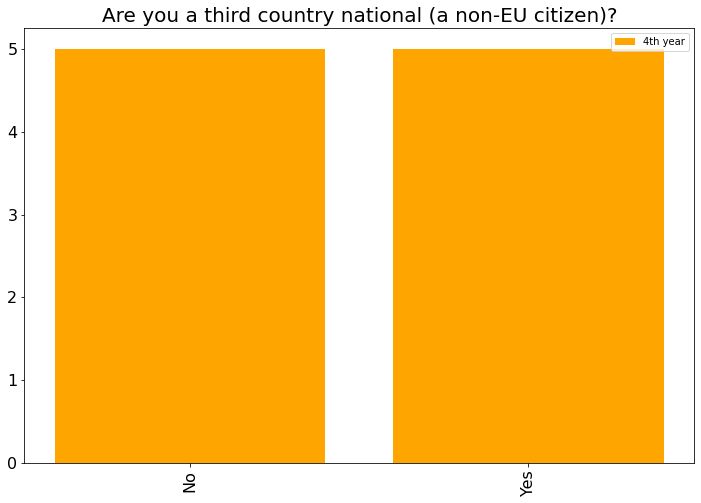

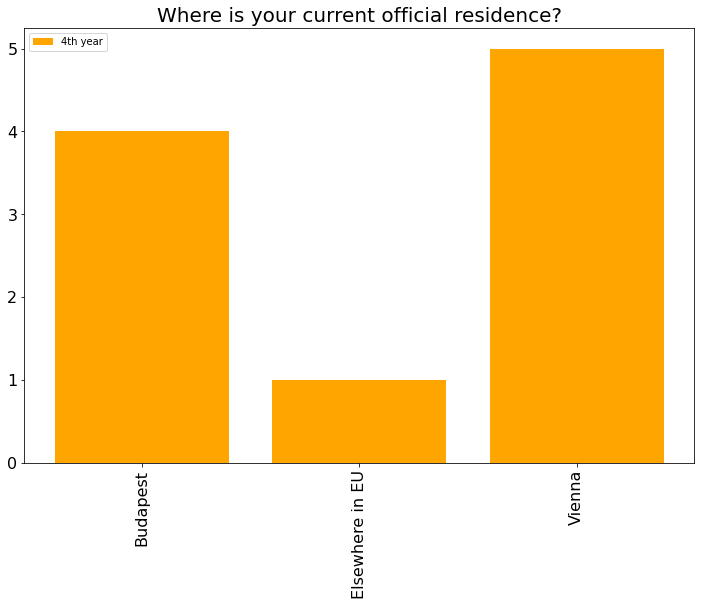

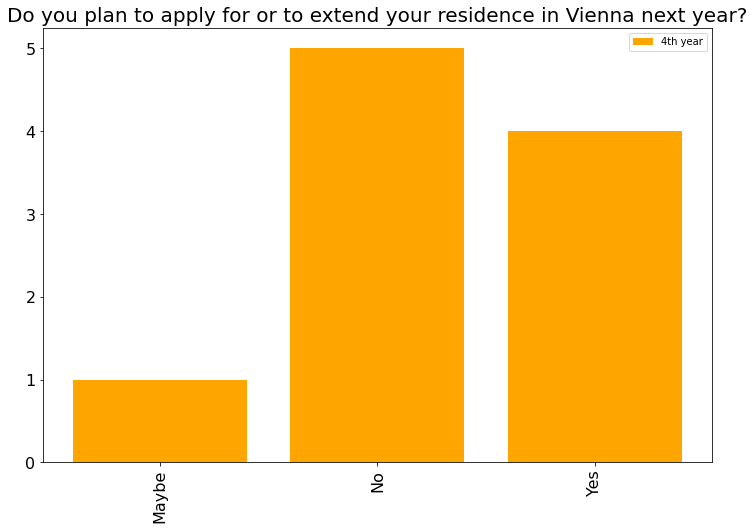

...

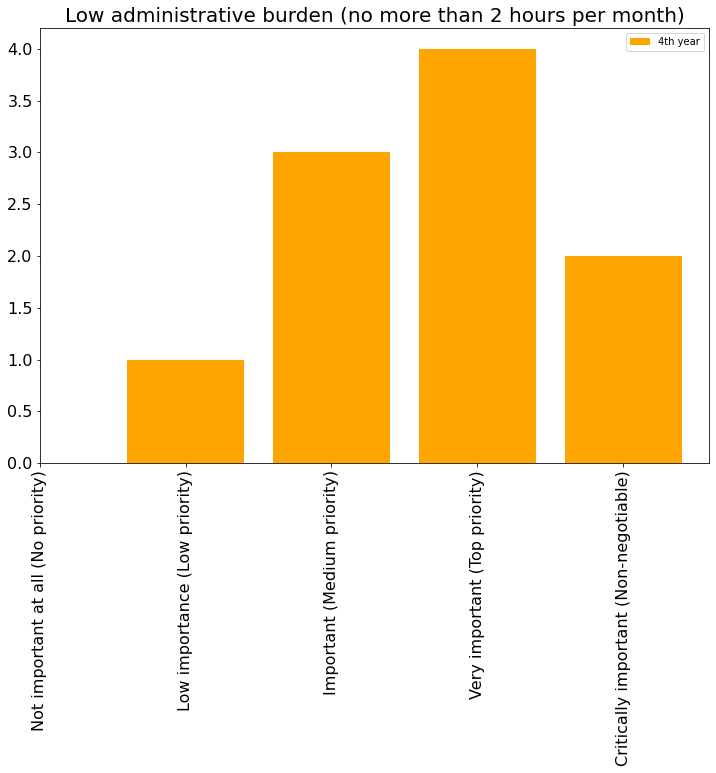

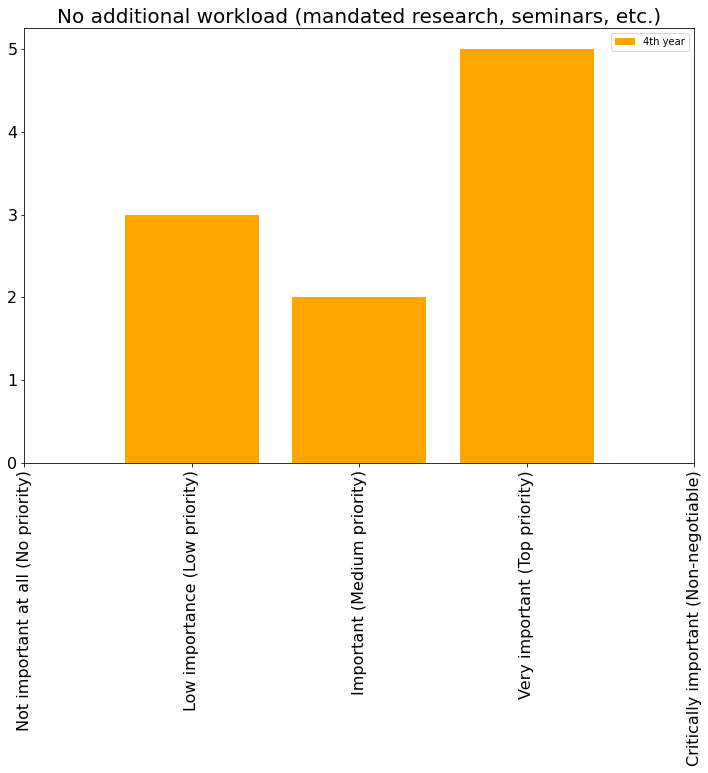

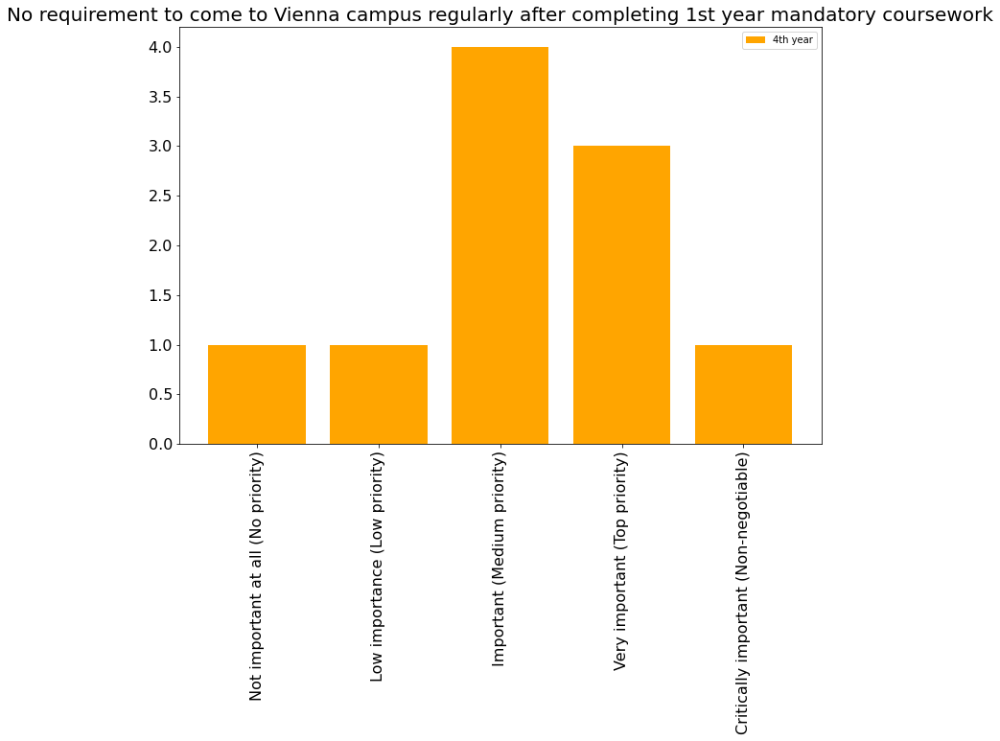

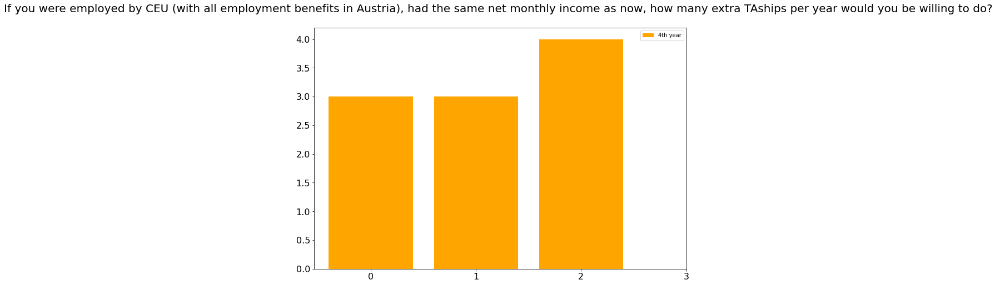

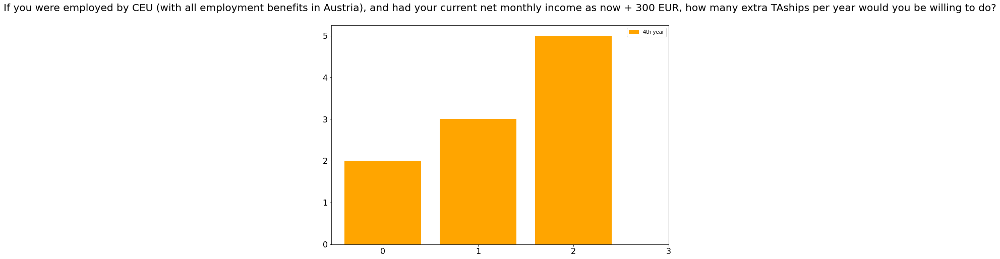

In [20]:
for i, column in enumerate(df.columns):
    #print(i)
    sublist = df_4[[column]].values
    labels, counts = np.unique(sublist, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels, counts,label='4th year', color='orange')
    if i>=6 and i<=26:
        #print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()

<ipython-input-21-14df579ba1c6>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8))


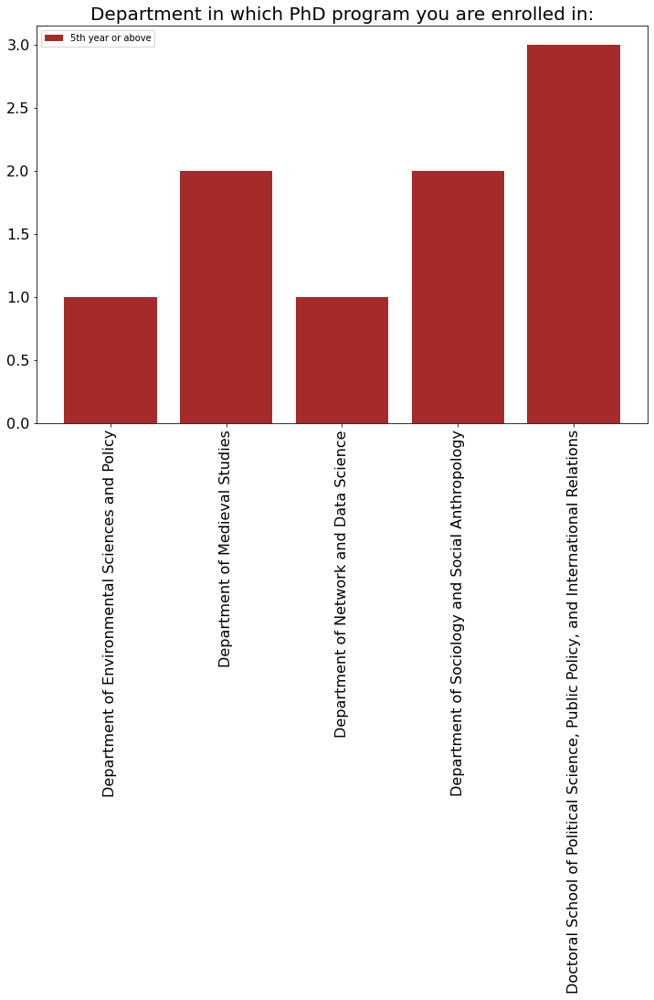

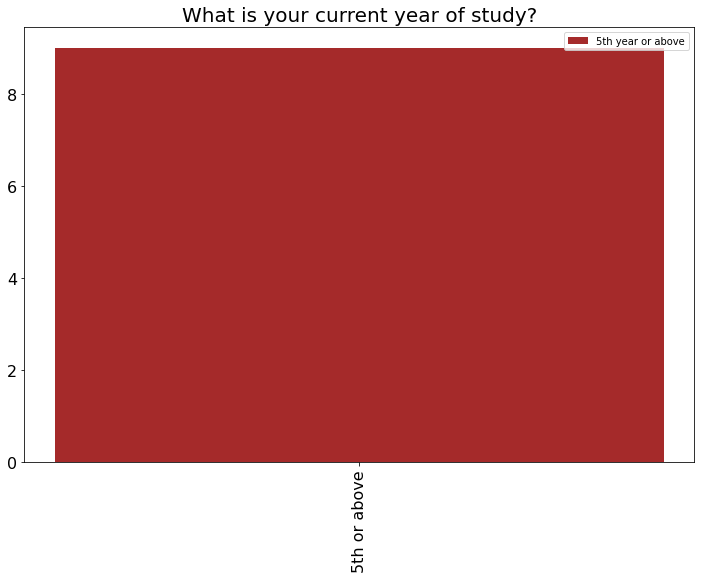

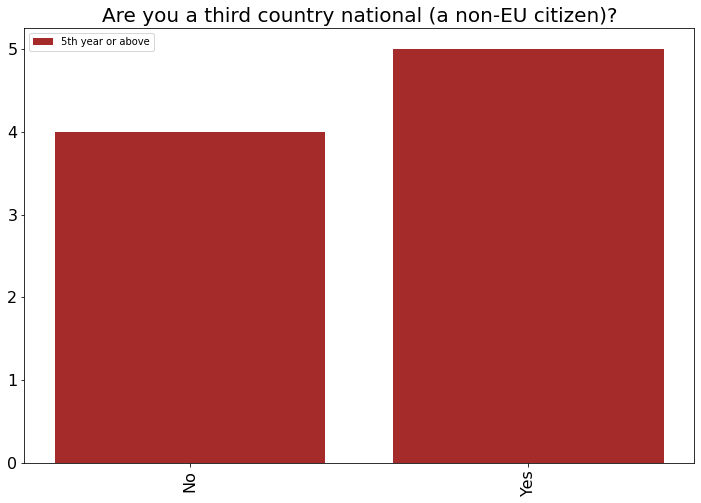

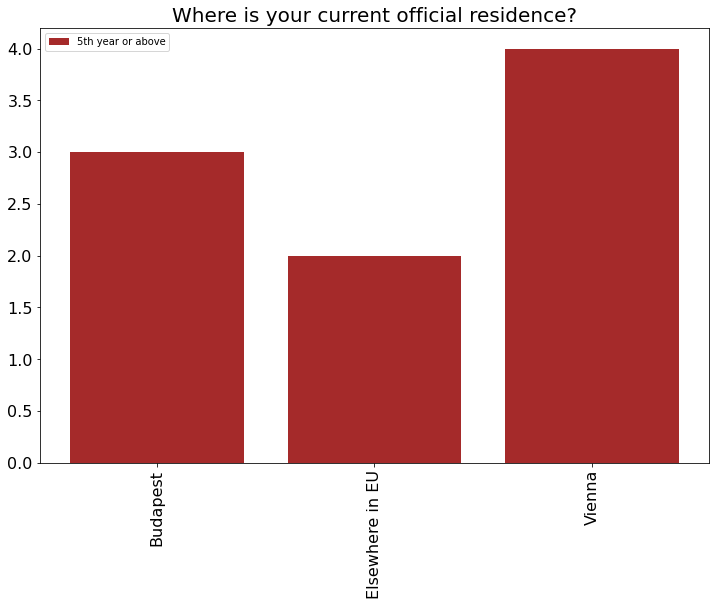

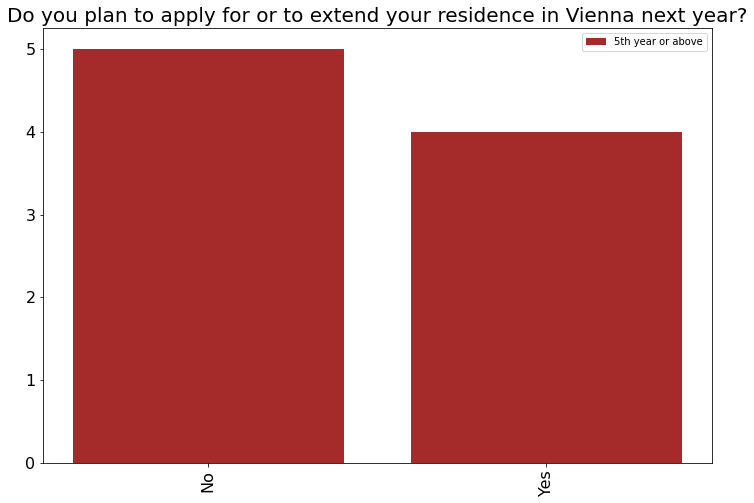

...

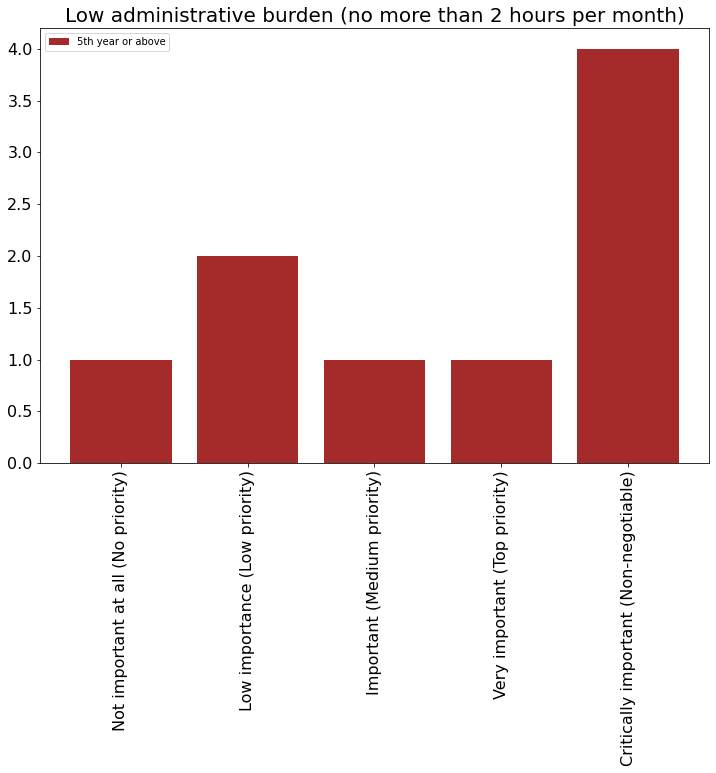

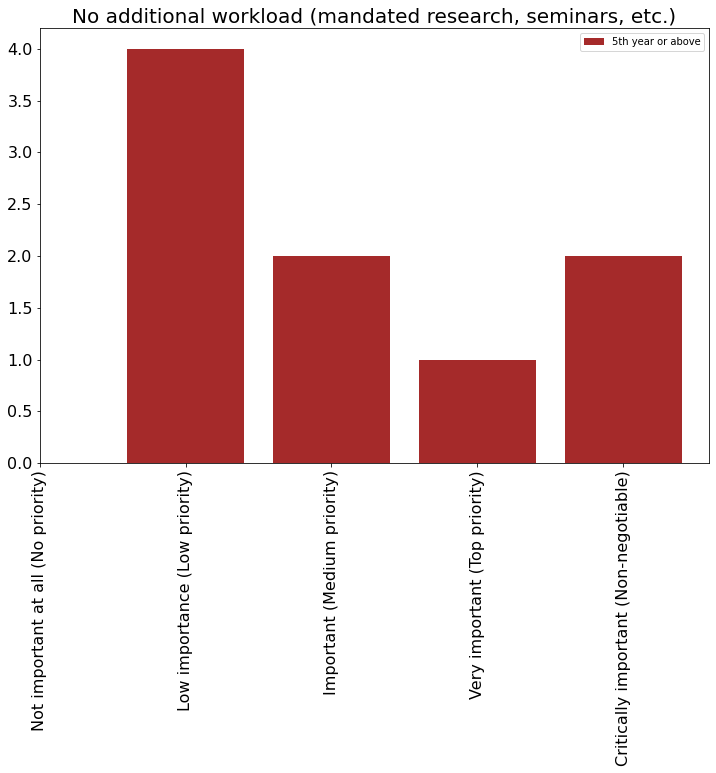

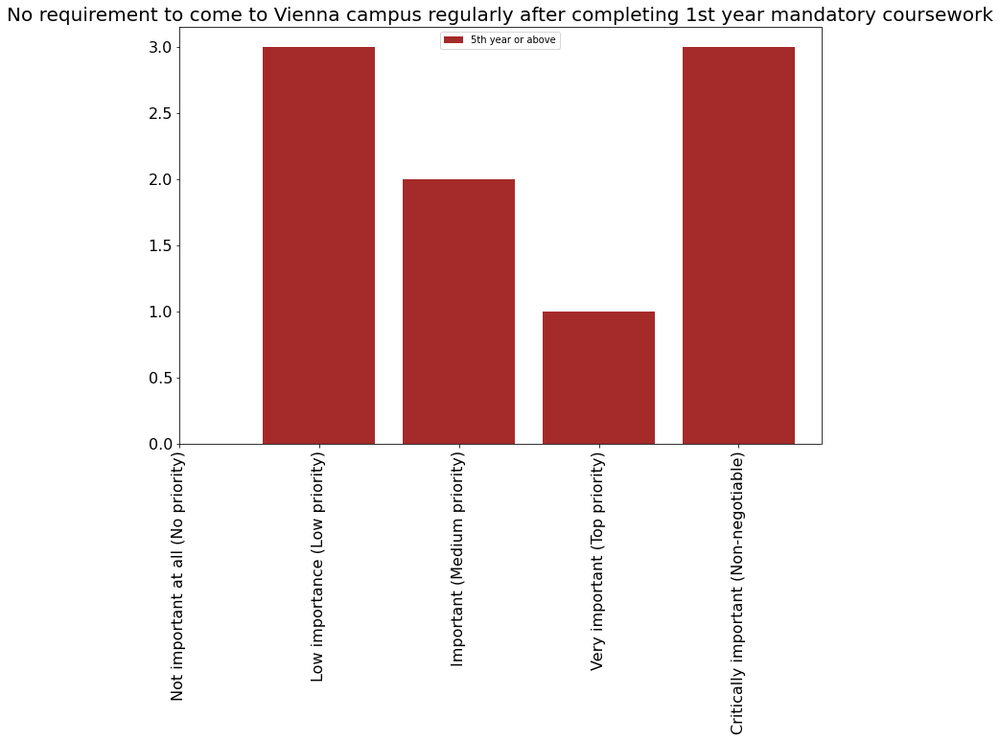

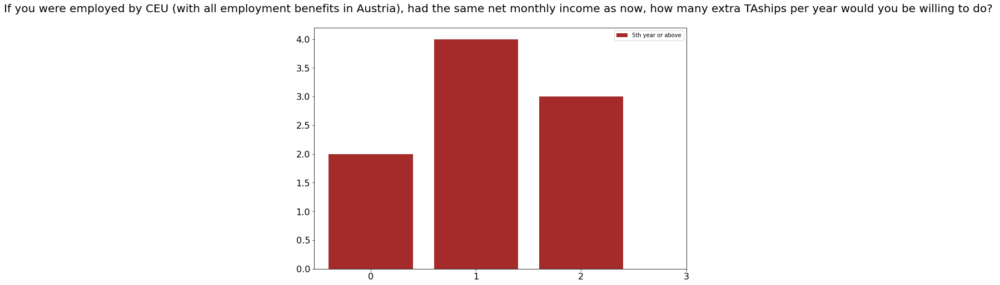

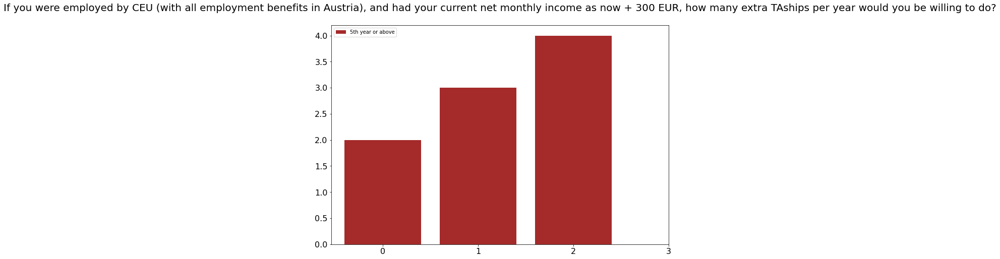

In [21]:
for i, column in enumerate(df.columns):
    #print(i)
    sublist = df_5[[column]].values
    labels, counts = np.unique(sublist, return_counts=True)
    plt.figure(figsize=(12,8))
    plt.bar(labels, counts,label='5th year or above', color='brown')
    if i>=6 and i<=26:
        #print(i)
        plt.xticks(rotation=90,ticks=[0,1,2,3,4],labels = ['Not important at all (No priority)','Low importance (Low priority)', 'Important (Medium priority)','Very important (Top priority)','Critically important (Non-negotiable)'])
    elif i > 26:
        plt.xticks(ticks=[0,1,2,3])
    else:
        plt.xticks(rotation=90)
    plt.title(column)
    plt.legend()